In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import numpy as np

In [2]:
########## SQ strategy

In [3]:
SQ = pd.read_csv(r'../../results/computed-fuel-rates-oct2021-sep2022.csv', low_memory=False)

In [4]:
#SQ.columns

In [5]:
SQ_copy=SQ.copy()
SQ_copy['diesel'] = SQ_copy['Energy'].apply(lambda x: x if x != 'electric' else 0)
SQ_copy['CO2'] = SQ_copy['diesel']*0.01086879 ### For each gallon of diesel burned, 9.86 kgCO$_2$e of greenhouse gas (GHG) emissions are produced.
### 9.86kg = 0.01086879 us tons
# Group by 'Route' and sum
grouped = SQ_copy.groupby('Route').agg({'CO2': 'sum', 'diesel': 'sum', 'dist': 'sum'}).reset_index()
# Calculate per mile columns
grouped['CO2_per_mile'] = grouped['CO2'] / grouped['dist']
grouped['diesel_per_mile'] = grouped['diesel'] / grouped['dist']
grouped

,Route,CO2,diesel,dist,CO2_per_mile,diesel_per_mile
0,(X) 34,14.251203,1311.204178,3493.935877,0.004079,0.375280
1,(X) 38,42.090720,3872.622469,12031.694755,0.003498,0.321868
2,(X) 39E,8.404819,773.298489,4020.914645,0.002090,0.192319
3,(X) 801,2.533077,233.059746,457.136333,0.005541,0.509825
4,(X) 802,2.928778,269.466818,672.751606,0.004353,0.400544
...,...,...,...,...,...,...
65,R41,192.518709,17712.984524,58438.453463,0.003294,0.303105
66,R42,148.002035,13617.158436,65889.851650,0.002246,0.206665
67,R44,197.336200,18156.225333,50933.595946,0.003874,0.356469
68,X90,542.498470,49913.419069,143406.411752,0.003783,0.348056


In [6]:
# Replace leading '(X)' and any leading whitespace
grouped['Route'] = grouped['Route'].str.replace(r'^\(X\)\s*', '', regex=True)
grouped['Route'].unique()

array(['34', '38', '39E', '801', '802', '803', '804', '805', '806', '820',
       '821', '823', '824', '892', '902', '943', 'B9', 'P11', '30', '31',
       '33', '35', '36', '45', '46', '890', '921', '9999', 'B12', 'B17',
       'B23', 'B4', 'B43', 'B48', 'B6', 'B7', 'B79', 'G1', 'G2', 'G3',
       'G5', 'G73', 'P20', 'P21', 'R10', 'R14', 'R24', 'R29', 'R41',
       'R42', 'R44', 'X90', 'X92'], dtype=object)

In [7]:
grouped.to_csv(r'../../results/do-nothing-diesel-whole-year.csv', index=False)

In [8]:
#grouped_trips

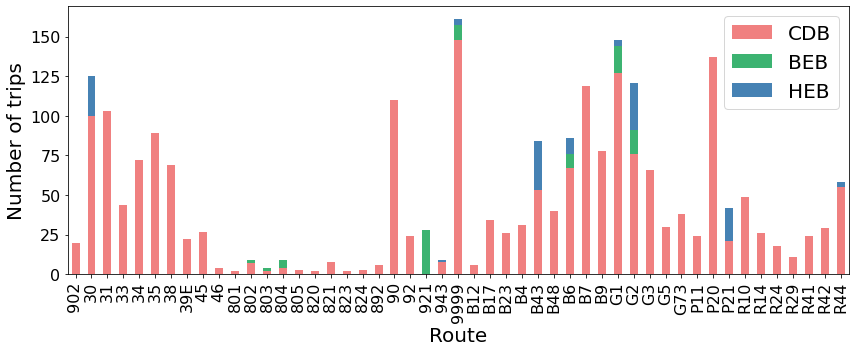

In [11]:
# Filter the dataframe for date 2021-10-29
SQ_filtered = SQ.loc[SQ['Date']=='2021-10-29'].copy()

# Remove X and (X) from routes names
SQ_filtered['Route'] = SQ_filtered['Route'].str.replace(r'\(X\)', '', regex=True) # replace (X)
SQ_filtered['Route'] = SQ_filtered['Route'].str.replace('X', '', regex=False) # replace X

# Group by Route and Powertrain to count unique trips
grouped_trips = SQ_filtered.groupby(['Route', 'Powertrain'])['Trip'].nunique().unstack(fill_value=0)

# Rename columns
grouped_trips = grouped_trips.rename(columns={
    'conventional': 'CDB',
    'hybrid': 'HEB',
    'electric': 'BEB'
})


# Plot
# Create a figure and a set of subplots with larger size
fig, ax = plt.subplots(figsize=(12, 5))

colors = {'CDB': 'lightcoral', 'HEB': 'steelblue', 'BEB': 'mediumseagreen'}
ax = grouped_trips.plot(kind='bar', stacked=True, color=[colors[col] for col in grouped_trips.columns], ax=ax)

# Annotate with BEB percentages
for index, (route, row) in enumerate(grouped_trips.iterrows()):
    total = row.sum()
    BEB_count = row.get('BEB', 0)
    percentage = (BEB_count / total) * 100
    
# Set the title and labels with larger font sizes
ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Number of trips', fontsize=20)
ax.legend(fontsize=20)
#ax.set_xlabel('')
#ax.set_xticks([])
# Increase the font size for tick labels
ax.tick_params(axis='both', labelsize=16)

plt.tight_layout()

fig.savefig(r'../../figures/SQ_route_electrification.png', dpi=400)  

plt.show()


In [12]:
# Compute the total BEB counts and total trips
total_BEB_counts = grouped_trips['BEB'].sum()
total_trips = grouped_trips.sum(axis=1).sum()

# Calculate average %BEB across all routes
average_percentage_BEB = (total_BEB_counts / total_trips) * 100

print(f"Average %BEB across all routes: {average_percentage_BEB:.2f}%")


Average %BEB across all routes: 3.82%


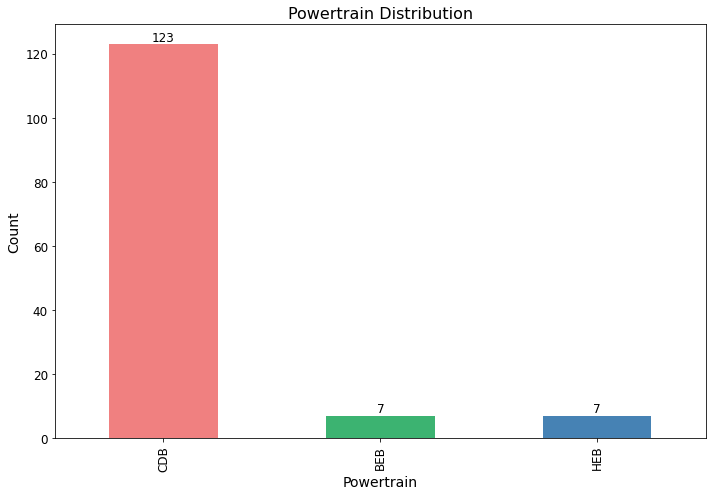

In [13]:
# Drop duplicate Vehicles while retaining the associated Powertrain
unique_vehicles = SQ_filtered.drop_duplicates(subset='Vehicle', keep='first')

# Count occurrences of each Powertrain
powertrain_counts = unique_vehicles['Powertrain'].value_counts()

# Define colors
colors = {'conventional': 'lightcoral', 'hybrid': 'steelblue', 'electric': 'mediumseagreen'}

# Create a larger plot with increased font size
plt.figure(figsize=(10,7))
ax = powertrain_counts.plot(kind='bar', color=[colors[p] for p in powertrain_counts.index])

# Annotate bars with their count
for i, v in enumerate(powertrain_counts):
    ax.text(i, v + 0.1, str(v), ha='center', va='bottom', fontsize=12)

# Labels, title, and formatting
plt.xlabel('Powertrain', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Powertrain Distribution', fontsize=16)
labels = {'conventional': 'CDB', 'hybrid': 'HEB', 'electric': 'BEB'}
plt.xticks(range(len(powertrain_counts.index)), [labels[p] for p in powertrain_counts.index], fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()

plt.show()

In [14]:
# Calculate sum for each Year for each DataFrame
#h_FH_variables['Result'] = h_FH_variables['Value'] * h_FH_variables['Coefficient']
#h_FH_sum = h_FH_variables.groupby('Year')['Result'].sum().reset_index()

#m_FH_variables['Result'] = m_FH_variables['Value'] * m_FH_variables['Coefficient']
#m_FH_sum = m_FH_variables.groupby('Year')['Result'].sum().reset_index()

#l_FH_variables['Result'] = l_FH_variables['Value'] * l_FH_variables['Coefficient']
#l_FH_sum = l_FH_variables.groupby('Year')['Result'].sum().reset_index()

# Add Scenario and Strategy columns
#h_FH_sum['Scenario'] = 'h'
#h_FH_sum['Strategy'] = 'FH'

#m_FH_sum['Scenario'] = 'm'
#m_FH_sum['Strategy'] = 'FH'

#l_FH_sum['Scenario'] = 'l'
#l_FH_sum['Strategy'] = 'FH'

# Concatenate the DataFrames
#final_df = pd.concat([h_FH_sum, m_FH_sum, l_FH_sum])

# Rearrange the columns
#final_df = final_df[['Year', 'Result', 'Scenario', 'Strategy']]
#final_df.to_csv(r'../../results/diesel-FH.csv', index=False)

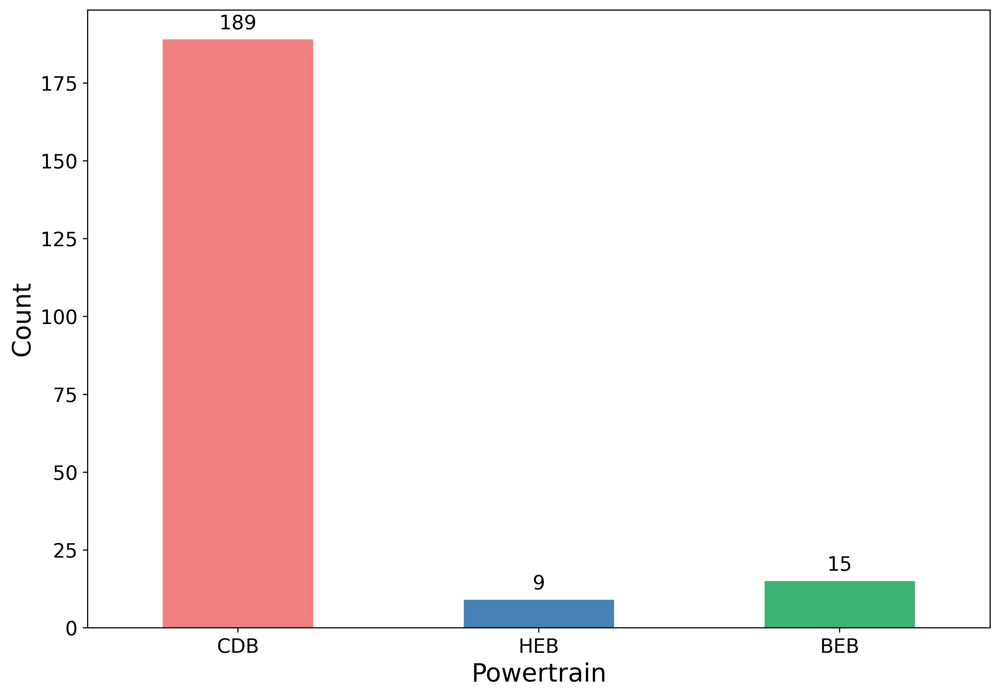

In [15]:
# Define counts and their labels
powertrain_counts = pd.Series({'conventional': 189, 'hybrid': 9, 'electric': 15})

# Define colors
colors = {'conventional': 'lightcoral', 'hybrid': 'steelblue', 'electric': 'mediumseagreen'}

# Create a larger plot with increased font size
plt.figure(figsize=(10,7), dpi=400)
ax = powertrain_counts.plot(kind='bar', color=[colors[p] for p in powertrain_counts.index])

# Annotate bars with their count
for i, v in enumerate(powertrain_counts):
    ax.text(i, v + 2, str(v), ha='center', va='bottom', fontsize=14)  # increased y-value a bit for better placement

# Labels, title, and formatting
plt.xlabel('Powertrain', fontsize=18)
plt.ylabel('Count', fontsize=18)
#plt.title('Powertrain Distribution', fontsize=22)
labels = {'conventional': 'CDB', 'hybrid': 'HEB', 'electric': 'BEB'}
plt.xticks(range(len(powertrain_counts.index)), [labels[p] for p in powertrain_counts.index], fontsize=14, rotation=0)  # set rotation to 0
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig(r'../../figures/fleet.png', dpi=400)  

plt.show()

In [16]:
# Create the 'Result' column in SQ dataframe
SQ['Result'] = SQ['Energy']
SQ.loc[SQ['Powertrain'] == 'electric', 'Result'] = 0
SQ_busiest = SQ.loc[SQ['Date']=='2021-10-29'].copy()


# Create the final_df dataframe
# Start by summing the Result values
total_result = SQ_busiest['Result'].sum()

# Create the dataframe with 'Year' values ranging from 0 to 12
df_SQ = pd.DataFrame({'Year': range(13)})

# Fill the other columns
df_SQ['Result'] = total_result
df_SQ['Scenario'] = 'c'
df_SQ['Strategy'] = 'SQ'

In [17]:
SQ_busiest['Result'].sum()

3754.3190736247534

In [18]:
# Group by Route and Powertrain to count unique trips
trips = SQ_filtered.groupby(['Powertrain'])['dist'].sum()

In [19]:
trips

Powertrain
conventional    11386.146799
electric          382.512323
hybrid            772.229864
Name: dist, dtype: float64

In [20]:
11386.146799/(11386.146799+382.512323+772.229864)

0.9079218237009278

In [21]:
382.512323/(11386.146799+382.512323+772.229864)

0.030501212747119994

In [22]:
772.229864/(11386.146799+382.512323+772.229864)

0.06157696355195213

In [23]:
11386.146799+382.512323+772.229864

12540.888986000002

In [24]:
df_SQ_diesel=pd.read_csv(r'../../results/diesel-SQ-calibrated.csv', low_memory=False)

In [25]:
df_BM = pd.read_csv(r'../../results/diesel-BM.csv', low_memory=False)

In [26]:
df_FE = pd.read_csv(r'../../results/diesel-FE.csv', low_memory=False)

In [27]:
df_FH = pd.read_csv(r'../../results/diesel-FH.csv', low_memory=False)

In [28]:
df_PP = pd.read_csv(r'../../results/diesel-PP.csv', low_memory=False)

In [29]:
# List of dataframes to concatenate
dfs = [df_SQ_diesel, df_PP, df_FH, df_FE, df_BM]

# Concatenate the dataframes
final_df = pd.concat(dfs, ignore_index=True)

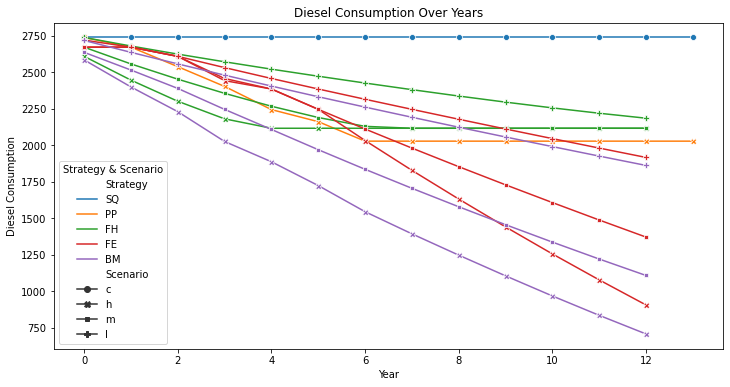

In [30]:
# Ensure that the data types are appropriate for plotting
final_df['Year'] = final_df['Year'].astype(int)
final_df['Result'] = final_df['Result'].astype(float)

# Create the line plot using seaborn
plt.figure(figsize=(12, 6))
sns.lineplot(data=final_df, x='Year', y='Result', hue='Strategy', style='Scenario', markers=True, dashes=False)

# Add titles and labels
plt.title('Diesel Consumption Over Years')
plt.xlabel('Year')
plt.ylabel('Diesel Consumption')
plt.legend(title='Strategy & Scenario')

# Display the plot
plt.show()


In [31]:
import pandas as pd

# Define a mapping dictionary
year_mapping = {i: 2022 + i for i in range(0, 14)}

# Apply the mapping
final_df['Year'] = final_df['Year'].map(year_mapping)

print(final_df)


     Year       Result Scenario Strategy
0    2022  2738.750000        c       SQ
1    2023  2738.750000        c       SQ
2    2024  2738.750000        c       SQ
3    2025  2738.750000        c       SQ
4    2026  2738.750000        c       SQ
..    ...          ...      ...      ...
140  2030  2123.929829        l       BM
141  2031  2057.020557        l       BM
142  2032  1991.163936        l       BM
143  2033  1926.154150        l       BM
144  2034  1862.135925        l       BM

[145 rows x 4 columns]


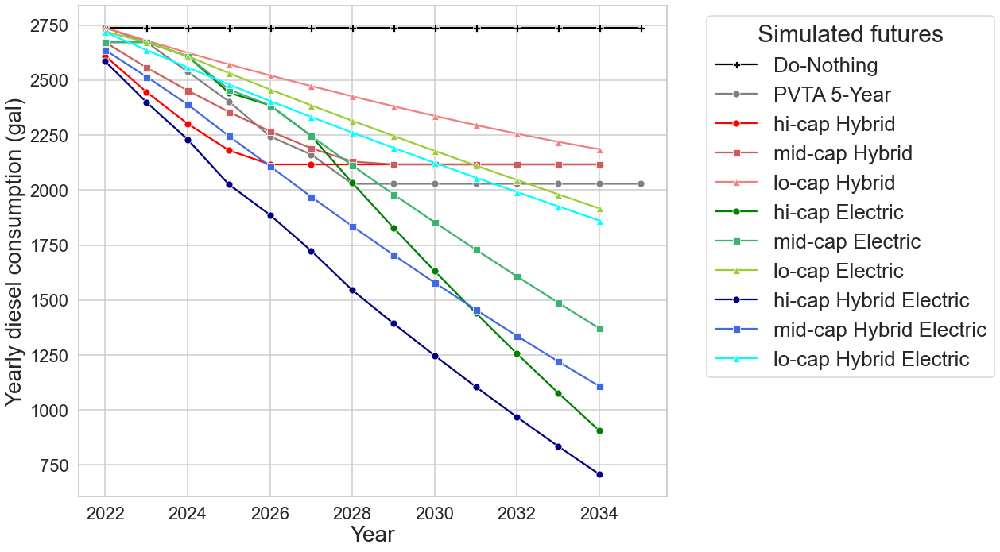

In [32]:
# Mapping combinations to desired names
mapping = {
    ('c', 'SQ'): 'Do-Nothing',
    ('h', 'PP'): 'PVTA 5-Year',
    ('l', 'FH'): 'lo-cap Hybrid',
    ('m', 'FH'): 'mid-cap Hybrid',
    ('h', 'FH'): 'hi-cap Hybrid',
    ('l', 'FE'): 'lo-cap Electric',
    ('m', 'FE'): 'mid-cap Electric',
    ('h', 'FE'): 'hi-cap Electric',
    ('l', 'BM'): 'lo-cap Hybrid Electric',
    ('m', 'BM'): 'mid-cap Hybrid Electric',
    ('h', 'BM'): 'hi-cap Hybrid Electric'
}



final_df['Label'] = final_df.set_index(['Scenario', 'Strategy']).index.map(mapping.get).values
unique_labels = final_df['Label'].unique()

# Improve the plot
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger

# Create a color palette
#palette = sns.color_palette('tab10', n_colors=len(unique_labels))

# Define a custom palette and marker order
custom_palette = {
    "Do-Nothing": "black",
    "PVTA 5-Year": "grey",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid Electric": "aqua",
    "mid-cap Hybrid Electric": "royalblue",
    "hi-cap Hybrid Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}
custom_markers = {
    "Do-Nothing": "P",
    "PVTA 5-Year": "o",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}

plt.figure(figsize=(18, 10))

# Use a loop to plot each category with its unique marker and color
for label in unique_labels:
    subset = final_df[final_df['Label'] == label]
    sns.lineplot(data=subset, x='Year', y='Result', label=label, dashes=False, 
                 color=custom_palette[label], marker=custom_markers[label])

# Add titles and labels
#plt.title('Diesel Consumption Over Years', fontsize=20)
plt.xlabel('Year', fontsize=28)
plt.ylabel('Yearly diesel consumption (gal)', fontsize=28)
plt.legend(title='Simulated futures', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=26, title_fontsize=30)
#plt.legend(handles=plot.get_lines(), labels=unique_labels, title='Configurations', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/diesel-consumption.png', dpi=400)

# Display the plot
plt.show()


In [33]:
ratios = pd.read_csv(r'../../results/diesel-consumption-distribution-compared-to-busiest-day.csv', low_memory=False)

In [34]:
ratios.columns

Index(['Date', 'UniqueTripsCount', 'Diesel', 'DieselRatio'], dtype='object')

In [35]:
### Scale up the busiest day to a whole year
final_df['YearlyResult'] = final_df['Result'].apply(lambda x: sum(x * ratios['DieselRatio']))
final_df

,Year,Result,Scenario,Strategy,Label,YearlyResult
0,2022,2738.750000,c,SQ,Do-Nothing,707460.738888
1,2023,2738.750000,c,SQ,Do-Nothing,707460.738888
2,2024,2738.750000,c,SQ,Do-Nothing,707460.738888
3,2025,2738.750000,c,SQ,Do-Nothing,707460.738888
4,2026,2738.750000,c,SQ,Do-Nothing,707460.738888
...,...,...,...,...,...,...
140,2030,2123.929829,l,BM,lo-cap Hybrid Electric,548643.346739
141,2031,2057.020557,l,BM,lo-cap Hybrid Electric,531359.665221
142,2032,1991.163936,l,BM,lo-cap Hybrid Electric,514347.899401
143,2033,1926.154150,l,BM,lo-cap Hybrid Electric,497554.883837


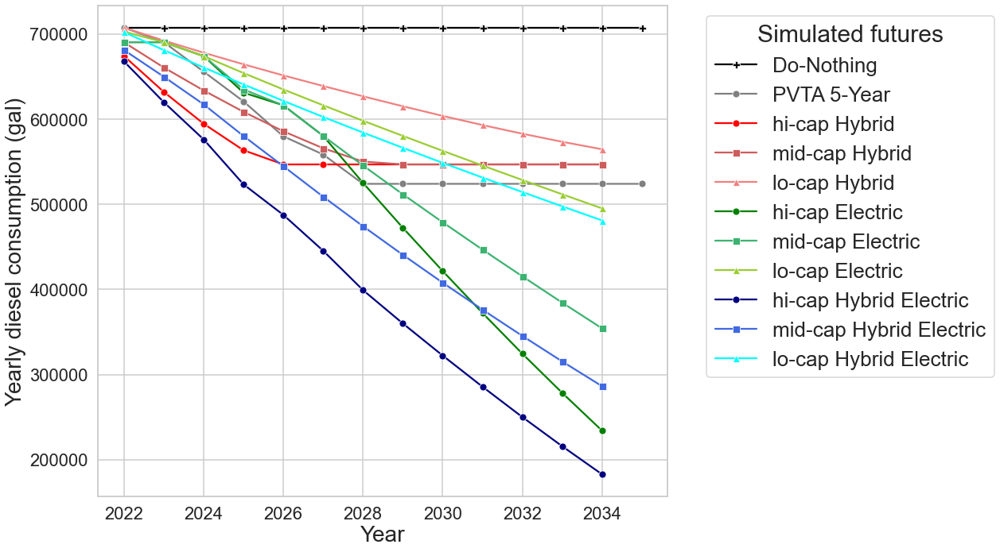

In [36]:
# Mapping combinations to desired names
mapping = {
    ('c', 'SQ'): 'Do-Nothing',
    ('h', 'PP'): 'PVTA 5-Year',
    ('l', 'FH'): 'lo-cap Hybrid',
    ('m', 'FH'): 'mid-cap Hybrid',
    ('h', 'FH'): 'hi-cap Hybrid',
    ('l', 'FE'): 'lo-cap Electric',
    ('m', 'FE'): 'mid-cap Electric',
    ('h', 'FE'): 'hi-cap Electric',
    ('l', 'BM'): 'lo-cap Hybrid Electric',
    ('m', 'BM'): 'mid-cap Hybrid Electric',
    ('h', 'BM'): 'hi-cap Hybrid Electric'
}



#final_df['Year'] = final_df['Year'] + 22

final_df['Label'] = final_df.set_index(['Scenario', 'Strategy']).index.map(mapping.get).values
unique_labels = final_df['Label'].unique()

# Improve the plot
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger

# Create a color palette
#palette = sns.color_palette('tab10', n_colors=len(unique_labels))

# Define a custom palette and marker order
custom_palette = {
    "Do-Nothing": "black",
    "PVTA 5-Year": "grey",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid Electric": "aqua",
    "mid-cap Hybrid Electric": "royalblue",
    "hi-cap Hybrid Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}
custom_markers = {
    "Do-Nothing": "P",
    "PVTA 5-Year": "o",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}

plt.figure(figsize=(18, 10))

# Use a loop to plot each category with its unique marker and color
for label in unique_labels:
    subset = final_df[final_df['Label'] == label]
    sns.lineplot(data=subset, x='Year', y='YearlyResult', label=label, dashes=False, 
                 color=custom_palette[label], marker=custom_markers[label])

# Add titles and labels
#plt.title('Diesel Consumption Over Years', fontsize=20)
plt.xlabel('Year', fontsize=28)
plt.ylabel('Yearly diesel consumption (gal)', fontsize=28)
plt.legend(title='Simulated futures', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=26, title_fontsize=30)
#plt.legend(handles=plot.get_lines(), labels=unique_labels, title='Configurations', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/yearly-diesel-consumption.png', dpi=400)

# Display the plot
plt.show()


In [37]:
#final_df['CO2']=final_df['YearlyResult']*9.841/1000 # /1000 to convert it to ton
final_df['CO2']=final_df['YearlyResult']*0.01086879 ### For each gallon of diesel burned, 9.86 kgCO$_2$e of greenhouse gas (GHG) emissions are produced.
### 9.86kg = 0.01086879 us tons

In [38]:
final_df

,Year,Result,Scenario,Strategy,Label,YearlyResult,CO2
0,2022,2738.750000,c,SQ,Do-Nothing,707460.738888,7689.242204
1,2023,2738.750000,c,SQ,Do-Nothing,707460.738888,7689.242204
2,2024,2738.750000,c,SQ,Do-Nothing,707460.738888,7689.242204
3,2025,2738.750000,c,SQ,Do-Nothing,707460.738888,7689.242204
4,2026,2738.750000,c,SQ,Do-Nothing,707460.738888,7689.242204
...,...,...,...,...,...,...,...
140,2030,2123.929829,l,BM,lo-cap Hybrid Electric,548643.346739,5963.089321
141,2031,2057.020557,l,BM,lo-cap Hybrid Electric,531359.665221,5775.236616
142,2032,1991.163936,l,BM,lo-cap Hybrid Electric,514347.899401,5590.339306
143,2033,1926.154150,l,BM,lo-cap Hybrid Electric,497554.883837,5407.819546


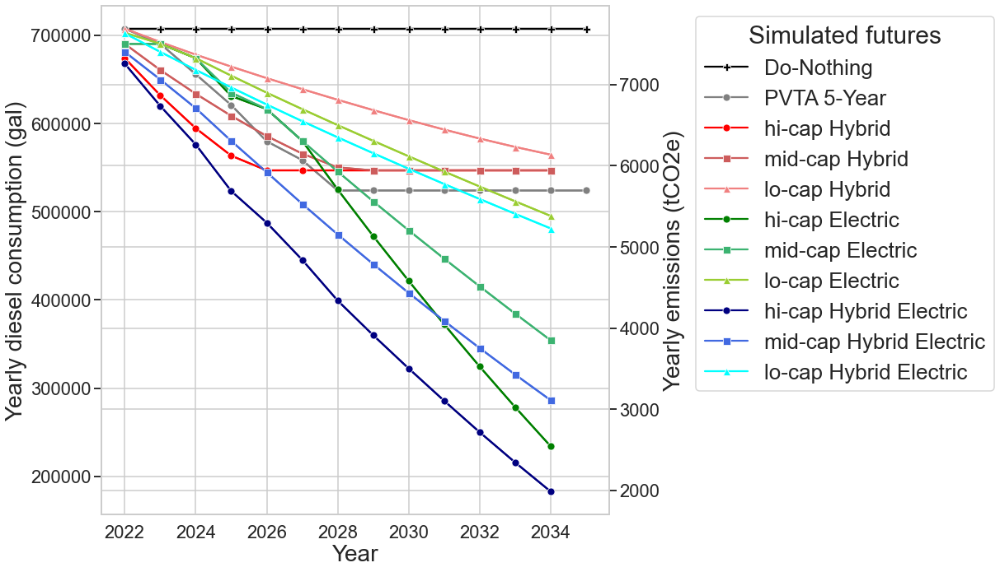

In [39]:
plt.figure(figsize=(18, 10))

# Create the primary y-axis
ax = plt.gca()

# Use a loop to plot each category with its unique marker and color
for label in unique_labels:
    subset = final_df[final_df['Label'] == label]
    sns.lineplot(data=subset, x='Year', y='YearlyResult', label=label, dashes=False, 
                 color=custom_palette[label], marker=custom_markers[label], ax=ax)

# Add titles and labels for primary y-axis
ax.set_xlabel('Year', fontsize=28)
ax.set_ylabel('Yearly diesel consumption (gal)', fontsize=28)
ax.legend(title='Simulated futures', bbox_to_anchor=(1.15, 1), loc='upper left', fontsize=26, title_fontsize=30)
ax.tick_params(axis='both', which='major', labelsize=22)

# Create secondary y-axis
ax2 = ax.twinx()

# Plot CO2 data on the secondary y-axis. I'm using a dashed line here, but you can customize as needed.
for label in unique_labels:
    subset = final_df[final_df['Label'] == label]
    sns.lineplot(data=subset, x='Year', y='CO2', dashes=True, color=custom_palette[label], marker=custom_markers[label], ax=ax2, legend=False)

ax2.set_ylabel('Yearly emissions (tCO2e)', fontsize=28)
ax2.tick_params(axis='y', which='major', labelsize=22)

# Save and display the plot
plt.tight_layout()
plt.savefig(r'../../figures/yearly-diesel-consumption-and-emissions.png', dpi=400)
plt.show()


In [40]:
# Group by 'Label' and sum 'Result'
summed_results = final_df.groupby('Label')['YearlyResult'].sum().reset_index()

# Find the sum of 'Result' for 'Do-nothing' label
do_nothing_value = summed_results[summed_results['Label'] == 'Do-Nothing']['YearlyResult'].values[0]

# Compute % decrease relative to 'Do-nothing'
summed_results['% Decrease'] = 100 * (do_nothing_value - summed_results['YearlyResult']) / do_nothing_value

summed_results

,Label,YearlyResult,% Decrease
0,Do-Nothing,9.904450e+06,0.000000
1,PVTA 5-Year,8.004626e+06,19.181522
2,hi-cap Electric,6.510704e+06,34.264865
3,hi-cap Hybrid,7.385240e+06,25.435132
4,hi-cap Hybrid Electric,5.335740e+06,46.127850
5,lo-cap Electric,7.794509e+06,21.302966
6,lo-cap Hybrid,8.192050e+06,17.289203
7,lo-cap Hybrid Electric,7.632230e+06,22.941404
8,mid-cap Electric,7.022906e+06,29.093429
9,mid-cap Hybrid,7.575669e+06,23.512471


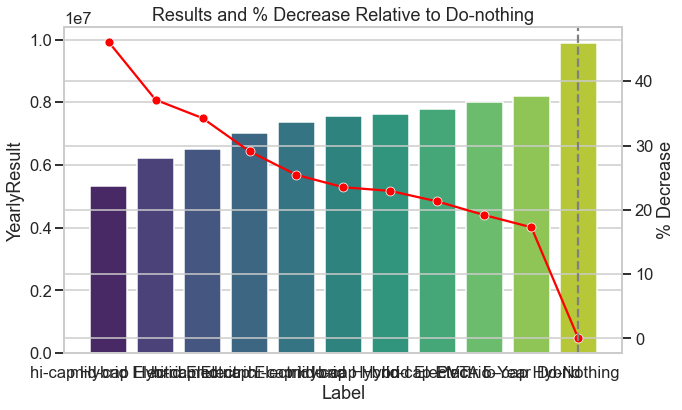

In [41]:
# Group by 'Label' and sum 'Result'
summed_results = final_df.groupby('Label')['YearlyResult'].sum().reset_index()

# Compute % decrease relative to 'Do-nothing'
do_nothing_value = summed_results[summed_results['Label'] == 'Do-Nothing']['YearlyResult'].values[0]
summed_results['% Decrease'] = 100 * (do_nothing_value - summed_results['YearlyResult']) / do_nothing_value

# Order dataframe based on 'Result'
summed_results = summed_results.sort_values('YearlyResult')

# Plot
plt.figure(figsize=(10, 6))

# Bar plot
sns.barplot(x='Label', y='YearlyResult', data=summed_results, palette='viridis')

# Line plot for % Decrease
ax2 = plt.gca().twinx()
sns.lineplot(x='Label', y='% Decrease', data=summed_results, ax=ax2, color='red', marker="o")

# Highlight 'Do-nothing'
plt.axvline(x=summed_results['Label'].tolist().index('Do-Nothing'), color='grey', linestyle='--')

# Legends and titles
plt.title('Results and % Decrease Relative to Do-nothing')
plt.gca().set(ylabel='% Decrease')
plt.show()

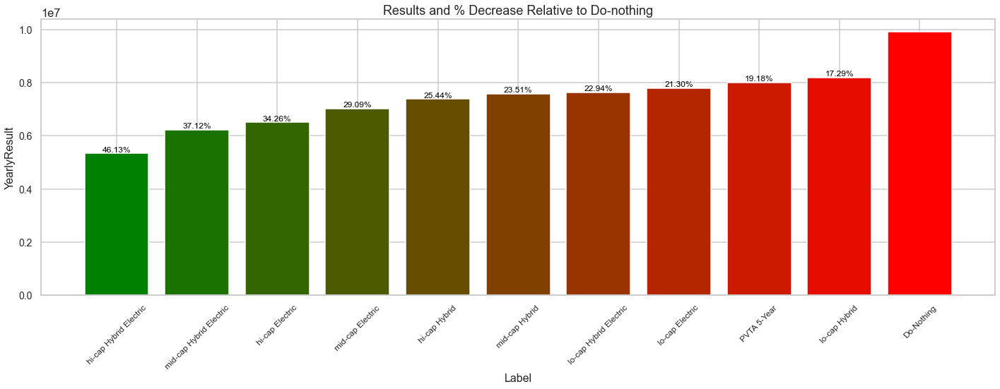

In [42]:
# Group by 'Label' and sum 'Result'
mean_results = final_df.groupby('Label')['YearlyResult'].sum().reset_index()

# Compute % decrease relative to 'Do-nothing'
do_nothing_value = mean_results[mean_results['Label'] == 'Do-Nothing']['YearlyResult'].values[0]
mean_results['% Decrease'] = 100 * (do_nothing_value - mean_results['YearlyResult']) / do_nothing_value

# Order dataframe based on 'Result'
mean_results = mean_results.sort_values('YearlyResult')

# Create custom colormap
colors = ["green", "red"]  # Reversed the order for proper gradient
cmap = LinearSegmentedColormap.from_list('custom', colors, N=len(mean_results))

# Derive bar colors from colormap
bar_colors = [cmap(i) for i in np.linspace(0, 1, len(mean_results))]

# Plot
plt.figure(figsize=(20, 8))
bars = plt.bar(mean_results['Label'], mean_results['YearlyResult'], color=bar_colors)

# Annotations on top of each bar
for idx, rect in enumerate(bars):
    height = rect.get_height()
    if mean_results.iloc[idx]['Label'] != 'Do-Nothing':
        plt.annotate(f"{mean_results.iloc[idx]['% Decrease']:.2f}%",
                     xy=(rect.get_x() + rect.get_width() / 2, height + 2),  # Adding a small offset on y for clarity
                     ha='center', va='bottom', fontsize=12, color='black')

# Style adjustments
plt.xticks(fontsize=12, rotation=45)  # Increased font size and rotated ticks by 45 degrees
plt.yticks(fontsize=14)
plt.xlabel('Label', fontsize=16)
plt.ylabel('YearlyResult', fontsize=16)
plt.title('Results and % Decrease Relative to Do-nothing', fontsize=18)
plt.tight_layout()
plt.show()


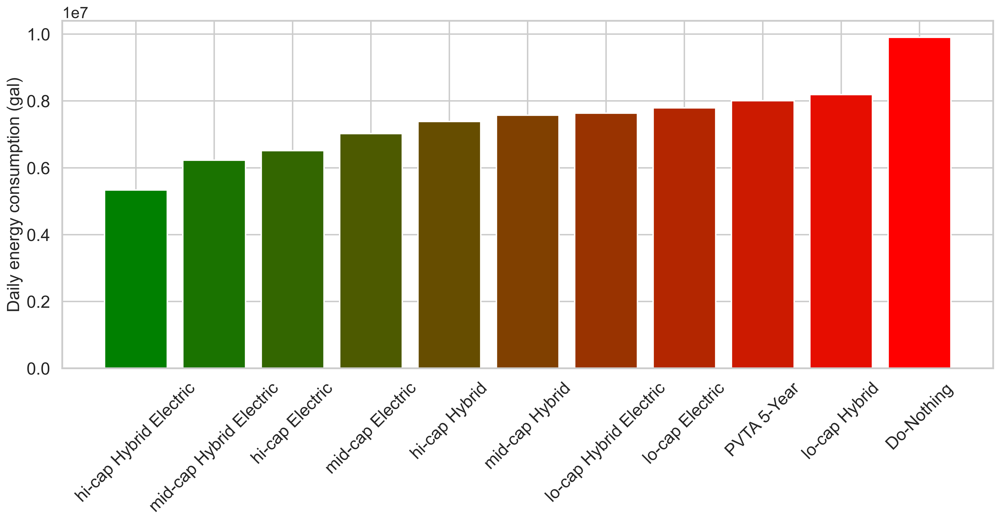

In [43]:
# Group by 'Label' and sum 'Result'
mean_results = final_df.groupby('Label')['YearlyResult'].sum().reset_index()

# Compute % decrease relative to 'Do-nothing'
do_nothing_value = mean_results[mean_results['Label'] == 'Do-Nothing']['YearlyResult'].values[0]
mean_results['% Decrease'] = 100 * (do_nothing_value - mean_results['YearlyResult']) / do_nothing_value

# Order dataframe based on 'Result'
mean_results = mean_results.sort_values('YearlyResult')

# Create custom colormap
colors = ["green", "red"]  # Reversed the order for proper gradient
cmap = LinearSegmentedColormap.from_list('custom', colors, N=len(mean_results))

# Derive bar colors from colormap
bar_colors = [cmap(i) for i in np.linspace(0, 1, len(mean_results))]

# Plot
plt.figure(figsize=(15, 8), dpi=400)  # Increased size
bars = plt.bar(mean_results['Label'], mean_results['YearlyResult'], color=bar_colors)

# Style adjustments
plt.xticks(fontsize=18, rotation=45)  # Increased font size and rotated ticks by 45 degrees
plt.yticks(fontsize=18)  # Increased font size
#plt.xlabel('Label', fontsize=20)  # Increased font size
plt.ylabel('Daily energy consumption (gal)', fontsize=18)  # Increased font size
#plt.title('Results and % Decrease Relative to Do-nothing', fontsize=24)  # Increased font size
# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/mean-diesel-consumption.png', dpi=400)  
plt.show()


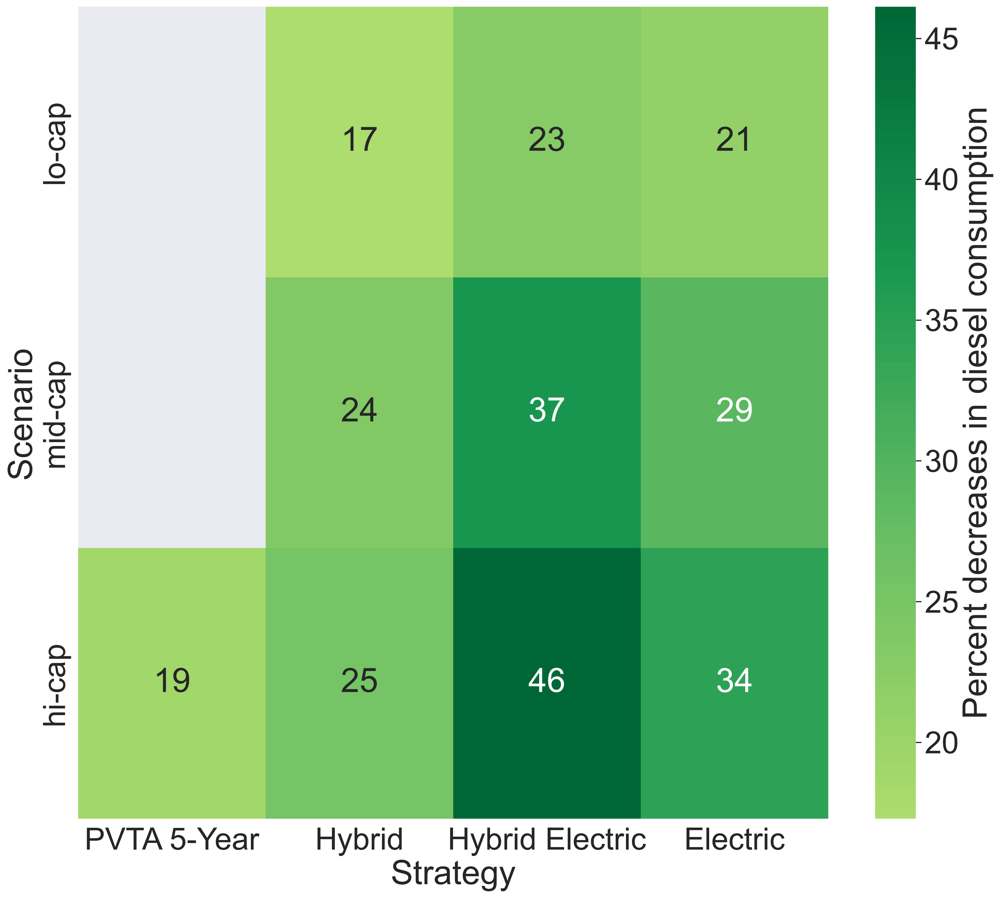

In [44]:
# Pivot dataframe to get desired structure
aggregated_df = final_df.groupby(['Scenario', 'Strategy'])['YearlyResult'].sum().reset_index().copy()

# Mapping for Scenario and Strategy columns
scenario_mapping = {
    'l': 'lo-cap',
    'm': 'mid-cap',
    'h': 'hi-cap',
    'c': 'c'   
}

strategy_mapping = {
    'SQ': 'Do-Nothing',
    'PP': 'PVTA 5-Year',
    'FH': 'Hybrid',
    'BM': 'Hybrid Electric',
    'FE': 'Electric'
}

# Replace values in the columns
aggregated_df['Scenario'] = aggregated_df['Scenario'].replace(scenario_mapping)
aggregated_df['Strategy'] = aggregated_df['Strategy'].replace(strategy_mapping)

pivot_df = aggregated_df.pivot('Scenario', 'Strategy', 'YearlyResult')

column_order = ['Do-Nothing', 'PVTA 5-Year', 'Hybrid', 'Hybrid Electric', 'Electric']
pivot_df = pivot_df[column_order]


# Compute %Decrease
reference_value = pivot_df.loc['c', 'Do-Nothing']

pivot_df = ((reference_value - pivot_df ) / reference_value) * 100

# Drop Scenario 'c' and Strategy 'Do-Nothing'
pivot_df = pivot_df.drop('c', axis=0)
pivot_df = pivot_df.drop('Do-Nothing', axis=1)

# Find min and max percentage decrease values
vmin_value, vmax_value = pivot_df.min().min(), pivot_df.max().max()

# Define the desired order for the y-axis
y_axis_order = ['lo-cap', 'mid-cap', 'hi-cap']

# Manually reorder the rows of the DataFrame based on the desired order
pivot_df = pivot_df.loc[y_axis_order]

# Plot heatmap
plt.figure(figsize=(18, 16), dpi=400)
sns.set(font_scale=3)
sns.heatmap(pivot_df, annot=True, fmt='.0f', cmap='RdYlGn', cbar_kws={'label': 'Percent decreases in diesel consumption'}, center=0, vmin=vmin_value, vmax=vmax_value)

#plt.title("Percentage Decrease Heatmap based on Scenario and Strategy")
plt.savefig(r'../../figures/decrease-diesel-heatmap.png', dpi=400)  

plt.show()


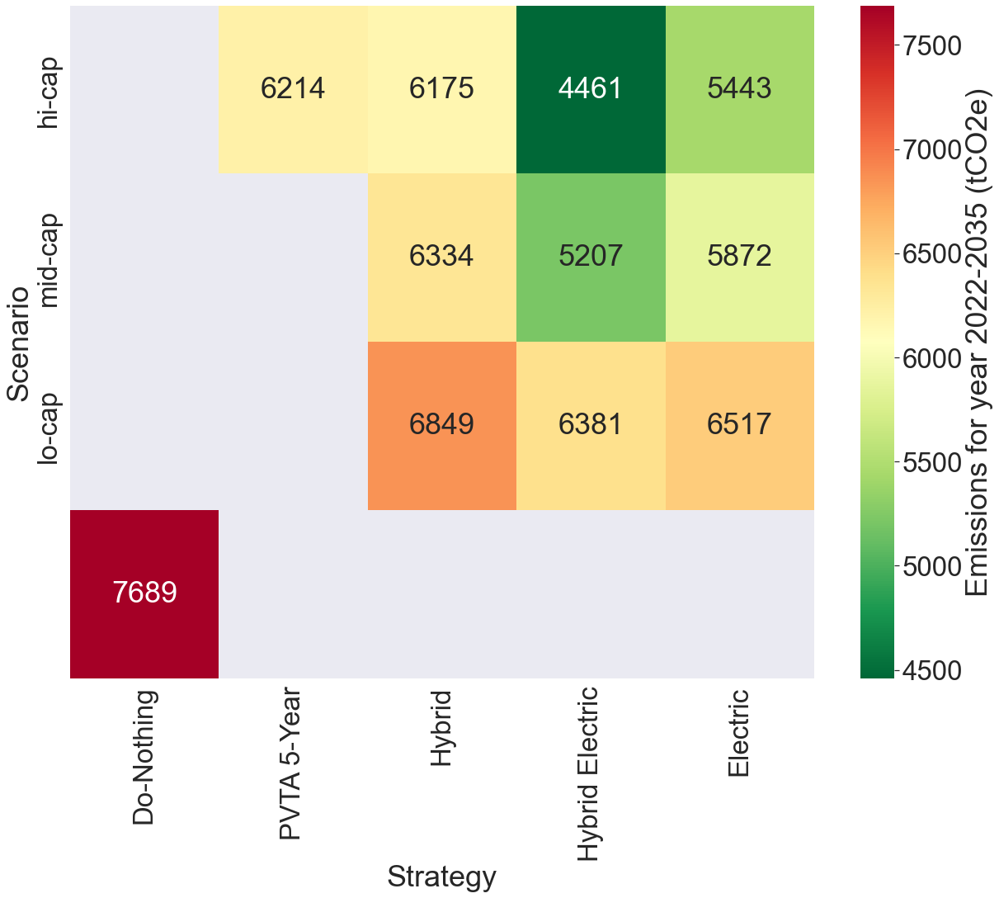

In [45]:
# Improve the plot
df_emission = final_df.copy()

# Mapping for Scenario and Strategy columns
scenario_mapping = {
    'l': 'lo-cap',
    'm': 'mid-cap',
    'h': 'hi-cap',
    'c': '',
}

strategy_mapping = {
    'SQ': 'Do-Nothing',
    'PP': 'PVTA 5-Year',
    'FH': 'Hybrid',
    'BM': 'Hybrid Electric',
    'FE': 'Electric'
}

# Replace values in the columns
df_emission['Scenario'] = df_emission['Scenario'].replace(scenario_mapping)
df_emission['Strategy'] = df_emission['Strategy'].replace(strategy_mapping)

pivot_df_emission = df_emission.pivot_table(values='CO2', index='Scenario', columns='Strategy', aggfunc='mean')

# Reorder the columns of pivot_df_emission
column_order = ['Do-Nothing', 'PVTA 5-Year', 'Hybrid', 'Hybrid Electric', 'Electric']
pivot_df_emission = pivot_df_emission[column_order]

# Define the desired order for the y-axis
y_axis_order = ['hi-cap','mid-cap','lo-cap','']

# Manually reorder the rows of the DataFrame based on the desired order
pivot_df_emission = pivot_df_emission.loc[y_axis_order]

vmin_value = pivot_df_emission.min().min()
vmax_value = pivot_df_emission.max().max()

# Set the aesthetics
sns.set_style("whitegrid")
sns.set_context("talk")

plt.figure(figsize=(18, 16))

# Create heatmap
sns.set(font_scale=3)
sns.heatmap(pivot_df_emission, annot=True, fmt='.0f', cmap='RdYlGn_r', cbar_kws={'label': 'Emissions for year 2022-2035 (tCO2e)'}, vmin=vmin_value, vmax=vmax_value)

# Add titles and labels
# Uncomment these lines if you want to include titles and labels
#plt.title('CO2 Emission Heatmap', fontsize=20)
#plt.xlabel('Strategy', fontsize=40)
#plt.ylabel('Scenario', fontsize=40)
#plt.xticks(fontsize=32, rotation=45)
#plt.yticks(fontsize=32)

# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/co2-emission-heatmap.png', dpi=400)

# Display the plot
plt.show()


In [46]:
pivot_df_emission=pivot_df_emission/1000

In [47]:
pivot_df_emission

Strategy,Do-Nothing,PVTA 5-Year,Hybrid,Hybrid Electric,Electric
Scenario,,,,,
hi-cap,NaN,6.214329,6.174510,4.461003,5.443344
mid-cap,NaN,NaN,6.333720,5.206845,5.871576
lo-cap,NaN,NaN,6.849051,6.381008,6.516683
,7.689242,NaN,NaN,NaN,NaN


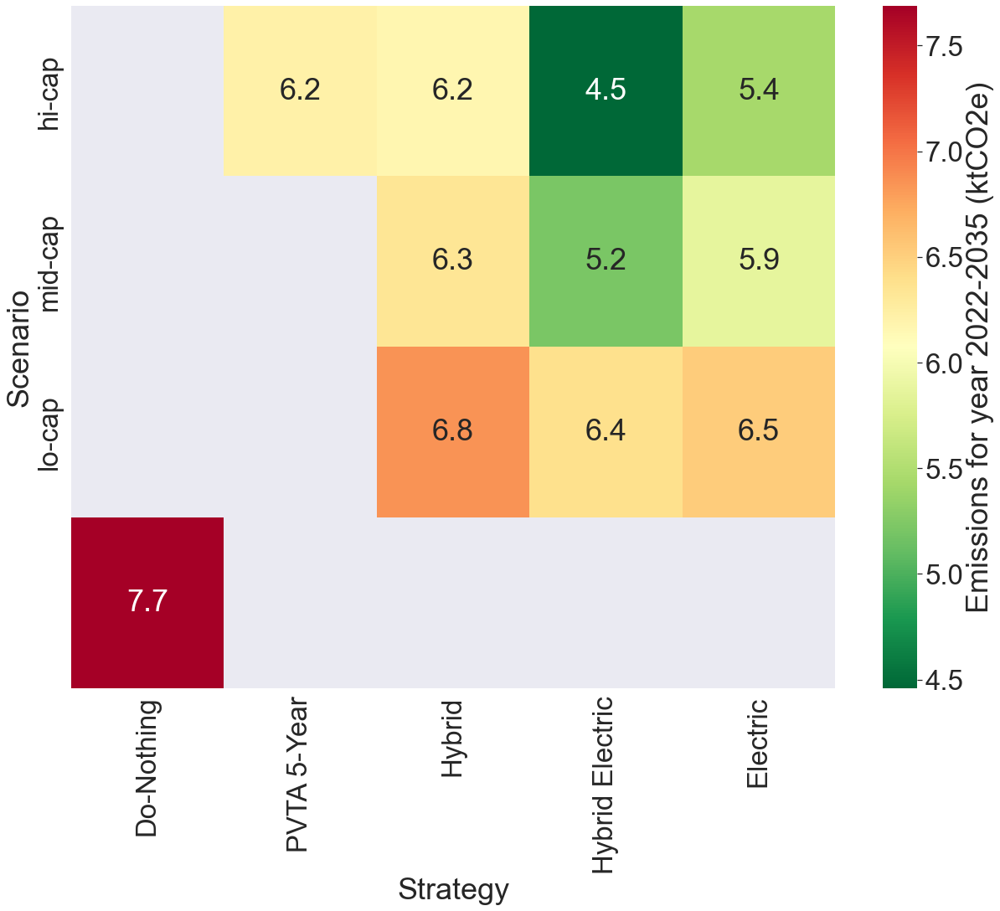

In [48]:
# Reorder the columns of pivot_df_emission
column_order = ['Do-Nothing', 'PVTA 5-Year', 'Hybrid', 'Hybrid Electric', 'Electric']
pivot_df_emission = pivot_df_emission[column_order]

# Define the desired order for the y-axis
y_axis_order = ['hi-cap','mid-cap','lo-cap','']

# Manually reorder the rows of the DataFrame based on the desired order
pivot_df_emission = pivot_df_emission.loc[y_axis_order]

vmin_value = pivot_df_emission.min().min()
vmax_value = pivot_df_emission.max().max()

# Set the aesthetics
sns.set_style("whitegrid")
sns.set_context("talk")

plt.figure(figsize=(18, 16))

# Create heatmap
sns.set(font_scale=3)
sns.heatmap(pivot_df_emission, annot=True, fmt='.1f', cmap='RdYlGn_r', cbar_kws={'label': 'Emissions for year 2022-2035 (ktCO2e)'}, vmin=vmin_value, vmax=vmax_value)

# Add titles and labels
# Uncomment these lines if you want to include titles and labels
#plt.title('CO2 Emission Heatmap', fontsize=20)
#plt.xlabel('Strategy', fontsize=40)
#plt.ylabel('Scenario', fontsize=40)
#plt.xticks(fontsize=32, rotation=45)
#plt.yticks(fontsize=32)

# Save the plot
plt.tight_layout()
plt.savefig(r'../../figures/co2-emission-heatmap.png', dpi=400)

# Display the plot
plt.show()

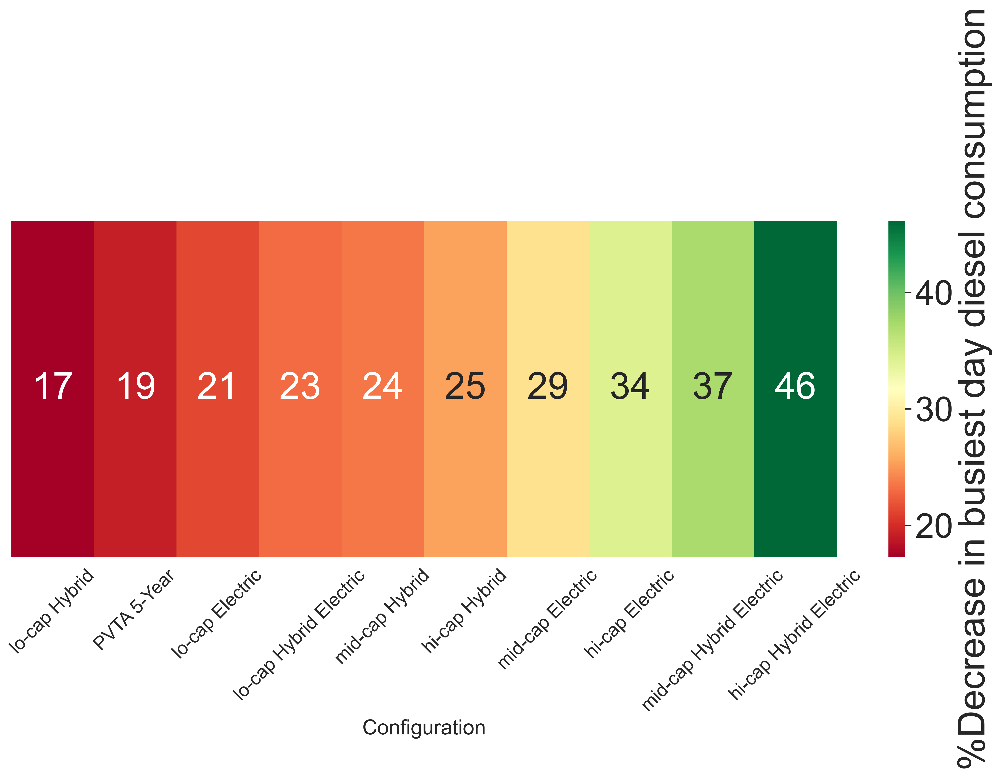

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter out the "Do-Nothing" configuration
mean_results = mean_results[mean_results['Label'] != 'Do-Nothing']

# Sort the data by % Decrease
mean_results = mean_results.sort_values(by='% Decrease')

# Convert DataFrame to a 2D array suitable for a heatmap
heatmap_data = mean_results.set_index('Label')['% Decrease'].T.values.reshape(1, -1)

plt.figure(figsize=(15, 8), dpi=400)

# Create the heatmap
sns.heatmap(heatmap_data, annot=True, cmap="RdYlGn", cbar_kws={'label': '%Decrease in busiest day diesel consumption'}, xticklabels=mean_results['Label'].tolist())

# Styling
plt.xticks(fontsize=18, rotation=45)
plt.yticks([])  # Hide the y-axis as it's not needed here
plt.xlabel('Configuration', fontsize=20)
#plt.title('% Decrease compared to Do-Nothing across configurations', fontsize=22)

plt.tight_layout()
plt.savefig(r'../../figures/relative-decrease-heatmap.png', dpi=400)
plt.show()


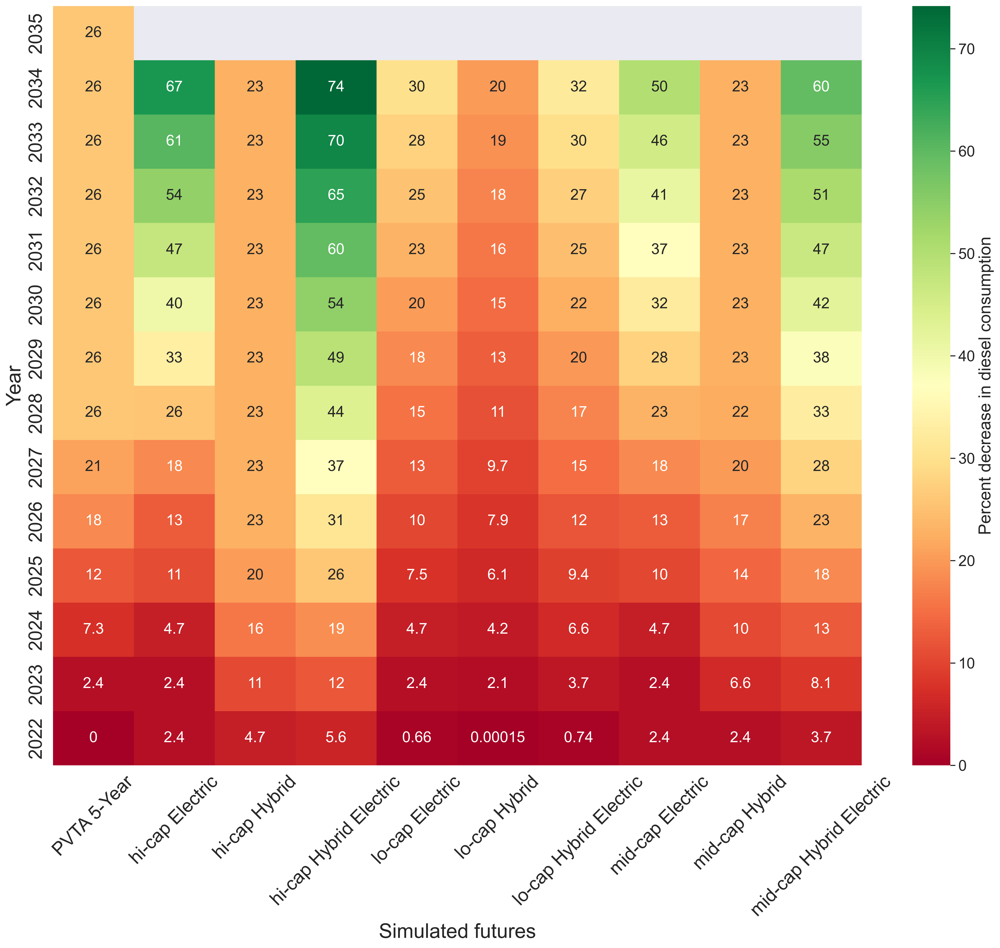

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate % decrease relative to 'Do-Nothing' for each Year
do_nothing_values = final_df[final_df['Label'] == 'Do-Nothing'].set_index('Year')['Result'].to_dict()
final_df['% Decrease'] = final_df.apply(lambda row: 100 * (do_nothing_values[row['Year']] - row['Result']) / do_nothing_values[row['Year']], axis=1)
#print(final_df['Label'])

future_mapping = {
    'Current Plan': 'PVTA 5-Year',
    'hi-cap Balanced Mix': 'hi-cap Hybrid Electric',
    'hi-cap Electric': 'hi-cap Electric',
    'hi-cap Hybrid': 'hi-cap Hybrid',
    'lo-cap Balanced Mix': 'lo-cap Hybrid Electric',
    'lo-cap Electric': 'lo-cap Electric',
    'lo-cap Hybrid': 'lo-cap Hybrid',    
    'mid-cap Balanced Mix': 'mid-cap Hybrid Electric',
    'mid-cap Electric': 'mid-cap Electric',
    'mid-cap Hybrid': 'mid-cap Hybrid',
}

# Replace values in the columns
final_df['Label'] = final_df['Label'].replace(future_mapping)

#print(final_df['Label'])


# Remove Do-Nothing rows from the data as it will have a 0% decrease 
final_df = final_df[final_df['Label'] != 'Do-Nothing']

# Pivot data for heatmap
sns.set(font_scale=1.5)
heatmap_data = final_df.pivot_table(index='Year', columns='Label', values='% Decrease')

plt.figure(figsize=(18, 16), dpi=400)

# Create the heatmap and store the returned axis in `ax`.
ax = sns.heatmap(heatmap_data, cmap="RdYlGn", annot=True, cbar_kws={'label': 'Percent decrease in diesel consumption'})

# Reverse the y-axis
ax.invert_yaxis()

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Adjusting the colorbar
cbar = ax.collections[0].colorbar
cbar.ax.figure.subplots_adjust(right=0.8)
cbar.ax.set_ylabel('Percent decrease in diesel consumption', size=20)
cbar.ax.tick_params(labelsize=18)

# Styling
plt.xlabel('Simulated futures', fontsize=24)
plt.ylabel('Year', fontsize=24)

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

plt.tight_layout()
plt.savefig(r'../../figures/yearly-relative-decrease-heatmap.png', dpi=400)
plt.show()


In [51]:
# Pivot data for heatmap
sns.set(font_scale=1.5)

plt.figure(figsize=(22, 20), dpi=400)

# Create the heatmap and store the returned axis in `ax`.
ax = sns.heatmap(heatmap_data, cmap="RdYlGn", annot=False, cbar_kws={'label': 'Percent decrease in diesel consumption'})

# Reverse the y-axis
ax.invert_yaxis()

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Adjusting the colorbar
cbar = ax.collections[0].colorbar
cbar.ax.figure.subplots_adjust(right=0.8)
cbar.ax.set_ylabel('Percent decrease in diesel consumption', size=40)
cbar.ax.tick_params(labelsize=30)

# Styling
plt.xlabel('Simulated futures', fontsize=40)
plt.ylabel('Year', fontsize=40)

plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
#plt.yticks(rotation=45)


plt.tight_layout()
plt.savefig(r'../../figures/yearly-relative-decrease-heatmap-v02.png', dpi=400)
plt.show()


In [52]:
### Prepare route-based diesel consumption for SQ and hi-cap BM

In [53]:
H_BM_energy = pd.read_csv(r'../../results/highcap-BM-energy-by-routes.csv', low_memory=False)

In [54]:
H_BM_energy = H_BM_energy.loc[H_BM_energy['Year']==12].copy()

In [55]:
H_BM_energy = H_BM_energy.loc[H_BM_energy['Value']==1].copy()

In [56]:
H_BM_energy = H_BM_energy.groupby('Route')[['Coefficient','dist']].sum().reset_index()

In [57]:
H_BM_energy = H_BM_energy.rename(columns={'Coefficient': 'Diesel'})

In [58]:
H_BM_energy['Diesel_per_mile']=H_BM_energy['Diesel']/H_BM_energy['dist']

In [59]:
H_BM_energy.to_csv(r'../../results/highcap-balanced-mix-diesel.csv', index=False)

In [60]:
SQ_filtered['Diesel'] = np.where(SQ_filtered['Powertrain'] != 'electric', SQ_filtered['Energy'], 0)

In [61]:
SQ_filtered = SQ_filtered.groupby('Route')[['Diesel','dist']].sum().reset_index()

In [62]:
SQ_filtered['Diesel_per_mile']=SQ_filtered['Diesel']/SQ_filtered['dist']

In [63]:
SQ_filtered.to_csv(r'../../results/do-nothing-diesel.csv', index=False)

In [64]:
PP_energy = pd.read_csv(r'../../results/highcap-PP-optimized-variables-aggregated.csv', low_memory=False)

In [65]:
PP_energy = PP_energy.loc[PP_energy['Year']==12].copy()

In [66]:
PP_energy = PP_energy.loc[PP_energy['Value']==1].copy()

In [67]:
PP_energy = PP_energy.groupby('Route')[['Coefficient','dist']].sum().reset_index()

In [68]:
PP_energy = PP_energy.rename(columns={'Coefficient': 'Diesel'})

In [69]:
PP_energy['Diesel_per_mile']=PP_energy['Diesel']/PP_energy['dist']

In [70]:
PP_energy.to_csv(r'../../results/pp-diesel.csv', index=False)

In [71]:
H_FE_energy = pd.read_csv(r'../../results/highcap-FE-optimized-variables-aggregated.csv', low_memory=False)

In [72]:
H_FE_energy = H_FE_energy.loc[H_FE_energy['Year']==12].copy()

In [73]:
H_FE_energy = H_FE_energy.loc[H_FE_energy['Value']==1].copy()

In [74]:
H_FE_energy = H_FE_energy.groupby('Route')[['Coefficient','dist']].sum().reset_index()

In [75]:
H_FE_energy = H_FE_energy.rename(columns={'Coefficient': 'Diesel'})

In [76]:
H_FE_energy['Diesel_per_mile']=H_FE_energy['Diesel']/H_FE_energy['dist']

In [77]:
H_FE_energy.to_csv(r'../../results/FE-diesel.csv', index=False)

In [78]:
H_BM_energy['Diesel'].sum()

341.481417981

In [79]:
SQ_filtered['Diesel'].sum()

3754.3190736247534

In [80]:
PP_energy['Diesel'].sum()

2028.4858373730003

In [81]:
### Prepare data for cost analysis

In [82]:
initial_values = {
    'HEB': 9,
    'BEB': 15
}

In [83]:
h_pp = pd.read_csv(r'../../results/highcap-PP-optimized-variables-y.csv', low_memory=False)

# Drop CDBs
h_pp = h_pp.loc[h_pp['Powertrain'] != 'CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_pp.loc[(h_pp['Year'] == 0) & (h_pp['Powertrain'] == 'HEB'), 'Value'] = 9
h_pp.loc[(h_pp['Year'] == 0) & (h_pp['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_pp['Diff'] = h_pp.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_pp['Diff'] = h_pp['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_pp['Investment Cost (M$)'] = h_pp.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)


In [84]:
h_FE = pd.read_csv(r'../../results/highcap-FE-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
h_FE = h_FE.loc[h_FE['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_FE.loc[(h_FE['Year'] == 0) & (h_FE['Powertrain'] == 'HEB'), 'Value'] = 9
h_FE.loc[(h_FE['Year'] == 0) & (h_FE['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_FE['Diff'] = h_FE.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_FE['Diff'] = h_FE['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_FE['Investment Cost (M$)'] = h_FE.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [85]:
m_FE = pd.read_csv(r'../../results/midcap-FE-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
m_FE = m_FE.loc[m_FE['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
m_FE.loc[(m_FE['Year'] == 0) & (m_FE['Powertrain'] == 'HEB'), 'Value'] = 9
m_FE.loc[(m_FE['Year'] == 0) & (m_FE['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
m_FE['Diff'] = m_FE.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
m_FE['Diff'] = m_FE['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
m_FE['Investment Cost (M$)'] = m_FE.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [86]:
l_FE = pd.read_csv(r'../../results/lowcap-FE-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
l_FE = l_FE.loc[l_FE['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
l_FE.loc[(l_FE['Year'] == 0) & (l_FE['Powertrain'] == 'HEB'), 'Value'] = 9
l_FE.loc[(l_FE['Year'] == 0) & (l_FE['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
l_FE['Diff'] = l_FE.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
l_FE['Diff'] = l_FE['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
l_FE['Investment Cost (M$)'] = l_FE.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [87]:
h_FH = pd.read_csv(r'../../results/highcap-FH-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
h_FH = h_FH.loc[h_FH['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_FH.loc[(h_FH['Year'] == 0) & (h_FH['Powertrain'] == 'HEB'), 'Value'] = 9
h_FH.loc[(h_FH['Year'] == 0) & (h_FH['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_FH['Diff'] = h_FH.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_FH['Diff'] = h_FH['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_FH['Investment Cost (M$)'] = h_FH.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [88]:
m_FH = pd.read_csv(r'../../results/midcap-FH-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
m_FH = m_FH.loc[m_FH['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
m_FH.loc[(m_FH['Year'] == 0) & (m_FH['Powertrain'] == 'HEB'), 'Value'] = 9
m_FH.loc[(m_FH['Year'] == 0) & (m_FH['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
m_FH['Diff'] = m_FH.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
m_FH['Diff'] = m_FH['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
m_FH['Investment Cost (M$)'] = m_FH.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [89]:
l_FH = pd.read_csv(r'../../results/lowcap-FH-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
l_FH = h_pp.loc[l_FH['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
l_FH.loc[(l_FH['Year'] == 0) & (l_FH['Powertrain'] == 'HEB'), 'Value'] = 9
l_FH.loc[(l_FH['Year'] == 0) & (l_FH['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
l_FH['Diff'] = l_FH.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
l_FH['Diff'] = l_FH['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
l_FH['Investment Cost (M$)'] = l_FH.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [90]:
h_BM = pd.read_csv(r'../../results/highcap-BM-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
h_BM = h_BM.loc[h_BM['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
h_BM.loc[(h_BM['Year'] == 0) & (h_BM['Powertrain'] == 'HEB'), 'Value'] = 9
h_BM.loc[(h_BM['Year'] == 0) & (h_BM['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
h_BM['Diff'] = h_BM.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
h_BM['Diff'] = h_BM['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
h_BM['Investment Cost (M$)'] = h_BM.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [91]:
m_BM = pd.read_csv(r'../../results/midcap-BM-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
m_BM = m_BM.loc[m_BM['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
m_BM.loc[(m_BM['Year'] == 0) & (m_BM['Powertrain'] == 'HEB'), 'Value'] = 9
m_BM.loc[(m_BM['Year'] == 0) & (m_BM['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
m_BM['Diff'] = m_BM.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
m_BM['Diff'] = m_BM['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
m_BM['Investment Cost (M$)'] = m_BM.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [92]:
l_BM = pd.read_csv(r'../../results/lowcap-BM-optimized-variables-y.csv', low_memory=False)
# Drop CDBs
l_BM = l_BM.loc[l_BM['Powertrain']!='CDB']

# Replace values for Year == 0 based on the initial values of each Powertrain
l_BM.loc[(l_BM['Year'] == 0) & (l_BM['Powertrain'] == 'HEB'), 'Value'] = 9
l_BM.loc[(l_BM['Year'] == 0) & (l_BM['Powertrain'] == 'BEB'), 'Value'] = 15

# Compute the difference in 'Value' column for each year compared to its previous year
l_BM['Diff'] = l_BM.groupby('Powertrain')['Value'].diff()

# Fill NaN values with 0 and set negative values to 0
l_BM['Diff'] = l_BM['Diff'].fillna(0).clip(lower=0)

# Calculate the investment cost for the additional fleet
l_BM['Investment Cost (M$)'] = l_BM.apply(lambda row: 0.9 * row['Diff'] if row['Powertrain'] == 'HEB' else 1.3 * row['Diff'], axis=1)

In [95]:
h_FE['Investment Cost (M$)'].sum()

193.70000000000005

In [96]:
h_FE

,Year,Investment Cost (M$),future
0,0,0.0,hi-cap Electric
1,1,10.4,hi-cap Electric
2,2,0.0,hi-cap Electric
3,3,5.2,hi-cap Electric
4,4,14.3,hi-cap Electric
5,5,5.2,hi-cap Electric
6,6,13.0,hi-cap Electric
7,7,20.8,hi-cap Electric
8,8,20.8,hi-cap Electric
9,9,20.8,hi-cap Electric


In [94]:
# Group by 'Year' and sum 'Investment Cost (M$)'
h_pp = h_pp.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
h_pp['future'] = 'PVTA 5-Year'
h_FE = h_FE.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
h_FE['future'] = 'hi-cap Electric'
m_FE = m_FE.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
m_FE['future'] = 'mid-cap Electric'
l_FE = l_FE.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
l_FE['future'] = 'lo-cap Electric'
h_FH = h_FH.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
h_FH['future'] = 'hi-cap Hybrid'
m_FH = m_FH.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
m_FH['future'] = 'mid-cap Hybrid'
l_FH = l_FH.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
l_FH['future'] = 'lo-cap Hybrid'
h_BM = h_BM.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
h_BM['future'] = 'hi-cap Hybrid Electric'
m_BM = m_BM.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
m_BM['future'] = 'mid-cap Hybrid Electric'
l_BM = l_BM.groupby('Year')['Investment Cost (M$)'].sum().reset_index()
l_BM['future'] = 'lo-cap Hybrid Electric'

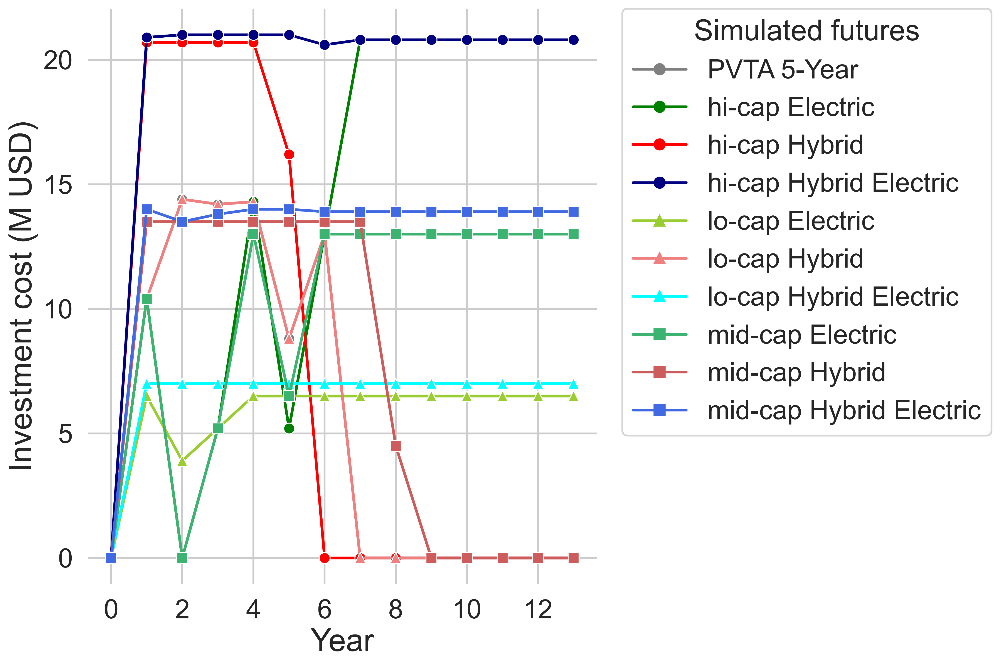

In [88]:
# Define a custom palette and marker order
custom_palette = {
    "Do-Nothing": "black",
    "PVTA 5-Year": "grey",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid Electric": "aqua",
    "mid-cap Hybrid Electric": "royalblue",
    "hi-cap Hybrid Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}
custom_markers = {
    "Do-Nothing": "P",
    "PVTA 5-Year": "o",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}


# Merge dataframes
dataframes = [h_pp, h_FE, m_FE, l_FE, h_FH, m_FH, l_FH, h_BM, m_BM, l_BM]  # Add all your dataframes in this list
merged_df = pd.concat(dataframes, ignore_index=True)

# Group by Year and future, then summing up the Investment Cost for each group
grouped_df = merged_df.groupby(['Year', 'future'])['Investment Cost (M$)'].sum().reset_index()

# Get the markers in the same order as the unique values in the 'future' column
markers_order = [custom_markers[future] for future in grouped_df['future'].unique()]


# Plotting with Seaborn
plt.figure(figsize=(12,8), dpi=400)
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger
sns.lineplot(data=grouped_df, x='Year', y='Investment Cost (M$)', hue='future',
                    palette=custom_palette, markers=markers_order, dashes=False, style='future')

plt.xlabel('Year', fontsize=26)
plt.ylabel('Investment cost (M USD)', fontsize=26)

# Move the legend to the right outside of the plot
plt.legend(title='Simulated futures', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=22, title_fontsize='24')

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

plt.grid(True)
sns.despine(left=True, bottom=True)
plt.tight_layout()

# Save the figure before showing it
plt.savefig(r'../../figures/investment_cost_plot.png', bbox_inches='tight', dpi=400)  
plt.show()


In [89]:
# Define a mapping dictionary
year_mapping = {i: 2022 + i for i in range(0, 14)}

# Apply the mapping
grouped_df['Year'] = grouped_df['Year'].map(year_mapping)

print(final_df)

     Year       Result Scenario Strategy                   Label  \
14   2022  2738.750000        h       PP             PVTA 5-Year   
15   2023  2672.557047        h       PP             PVTA 5-Year   
16   2024  2538.742642        h       PP             PVTA 5-Year   
17   2025  2403.343952        h       PP             PVTA 5-Year   
18   2026  2244.563796        h       PP             PVTA 5-Year   
..    ...          ...      ...      ...                     ...   
140  2030  2123.929829        l       BM  lo-cap Hybrid Electric   
141  2031  2057.020557        l       BM  lo-cap Hybrid Electric   
142  2032  1991.163936        l       BM  lo-cap Hybrid Electric   
143  2033  1926.154150        l       BM  lo-cap Hybrid Electric   
144  2034  1862.135925        l       BM  lo-cap Hybrid Electric   

      YearlyResult          CO2  % Decrease  
14   707460.738888  7689.242204    0.000000  
15   690362.093360  7503.400617    2.416904  
16   655795.799308  7127.706826    7.302870  

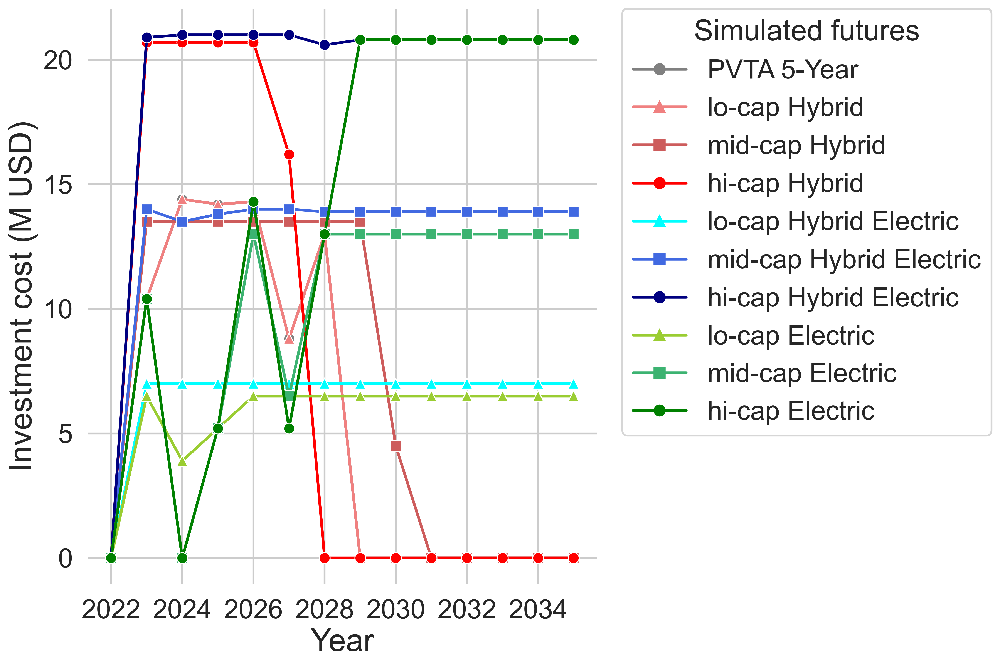

In [90]:
# Plotting with Seaborn
custom_palette = {
    "PVTA 5-Year": "grey",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid Electric": "aqua",
    "mid-cap Hybrid Electric": "royalblue",
    "hi-cap Hybrid Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}

plt.figure(figsize=(12,8), dpi=400)
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger

# Set the hue_order based on custom_palette
sns.lineplot(data=grouped_df, x='Year', y='Investment Cost (M$)', hue='future',
             palette=custom_palette, markers=markers_order, dashes=False, style='future',
             hue_order=custom_palette.keys())  # This line forces the order

plt.xlabel('Year', fontsize=26)
plt.ylabel('Investment cost (M USD)', fontsize=26)

# Move the legend to the right outside of the plot
plt.legend(title='Simulated futures', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=22, title_fontsize='24')

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

plt.grid(True)
sns.despine(left=True, bottom=True)
plt.tight_layout()

# Save the figure before showing it
plt.savefig(r'../../figures/investment_cost_plot.png', bbox_inches='tight', dpi=400)  
plt.show()


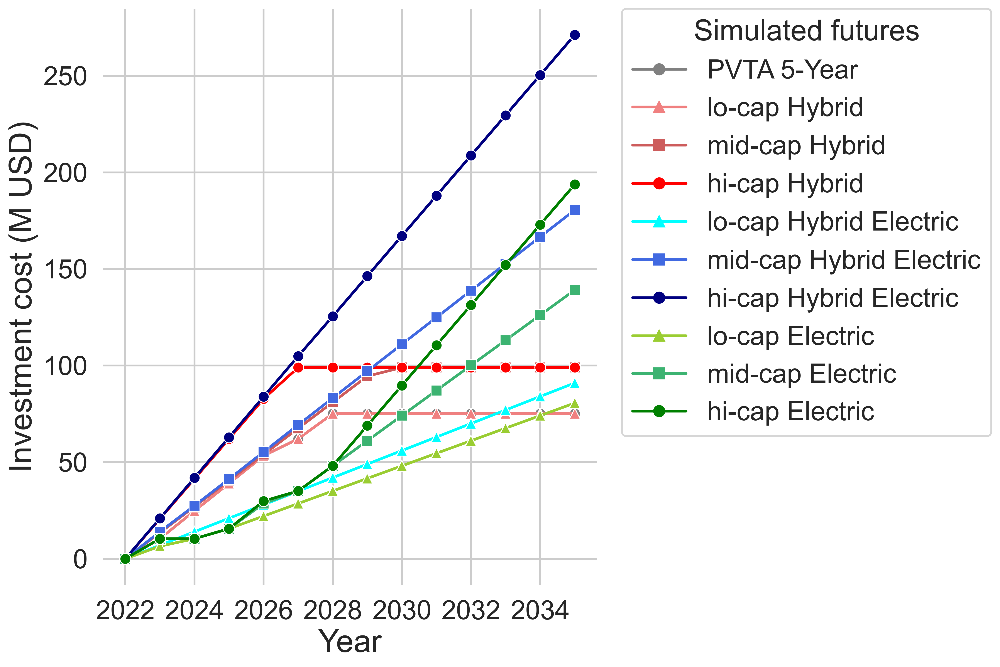

In [91]:
# Sorting by 'Year' and calculating the cumulative sum for each 'future' group
grouped_df['Cumulative Cost'] = grouped_df.sort_values(by='Year').groupby('future')['Investment Cost (M$)'].cumsum()

plt.figure(figsize=(12,8), dpi=400)
sns.set_style("whitegrid")
sns.set_context("talk")  # makes everything larger

# Adjust the sns.lineplot function to use 'Cumulative Cost' column
sns.lineplot(data=grouped_df, x='Year', y='Cumulative Cost', hue='future',
             palette=custom_palette, markers=markers_order, dashes=False, style='future',
             hue_order=custom_palette.keys())

plt.xlabel('Year', fontsize=26)
plt.ylabel('Investment cost (M USD)', fontsize=26)

# Move the legend to the right outside of the plot
plt.legend(title='Simulated futures', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=22, title_fontsize='24')

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

plt.grid(True)
sns.despine(left=True, bottom=True)
plt.tight_layout()

# Save the figure before showing it
plt.savefig(r'../../figures/investment_cost_plot.png', bbox_inches='tight', dpi=400)  
plt.show()

In [92]:
grouped_df

,Year,future,Investment Cost (M$),Cumulative Cost
0,2022,PVTA 5-Year,0.0,0.0
1,2022,hi-cap Electric,0.0,0.0
2,2022,hi-cap Hybrid,0.0,0.0
3,2022,hi-cap Hybrid Electric,0.0,0.0
4,2022,lo-cap Electric,0.0,0.0
...,...,...,...,...
135,2035,lo-cap Hybrid,0.0,75.1
136,2035,lo-cap Hybrid Electric,7.0,91.0
137,2035,mid-cap Electric,13.0,139.1
138,2035,mid-cap Hybrid,0.0,99.0


In [93]:
pivot_df

Strategy,PVTA 5-Year,Hybrid,Hybrid Electric,Electric
Scenario,,,,
lo-cap,NaN,17.289203,22.941404,21.302966
mid-cap,NaN,23.512471,37.120887,29.093429
hi-cap,19.181522,25.435132,46.127850,34.264865


In [94]:
grouped_df

,Year,future,Investment Cost (M$),Cumulative Cost
0,2022,PVTA 5-Year,0.0,0.0
1,2022,hi-cap Electric,0.0,0.0
2,2022,hi-cap Hybrid,0.0,0.0
3,2022,hi-cap Hybrid Electric,0.0,0.0
4,2022,lo-cap Electric,0.0,0.0
...,...,...,...,...
135,2035,lo-cap Hybrid,0.0,75.1
136,2035,lo-cap Hybrid Electric,7.0,91.0
137,2035,mid-cap Electric,13.0,139.1
138,2035,mid-cap Hybrid,0.0,99.0


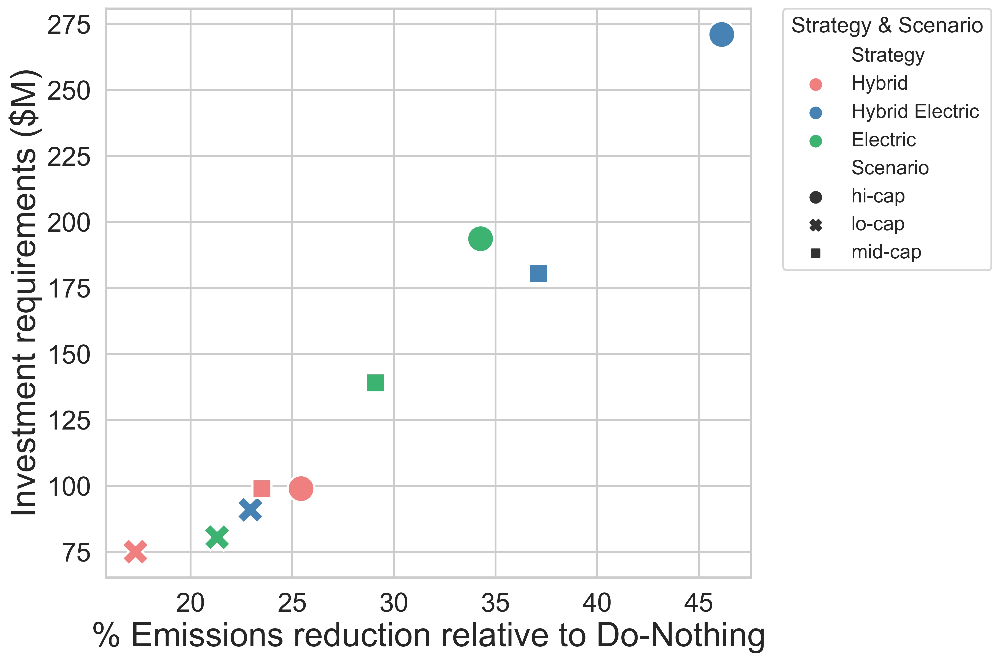

In [95]:
# Reshaping pivot_df
pivot_melted = pivot_df.reset_index().melt(id_vars='Scenario', 
                                           value_vars=pivot_df.columns, 
                                           var_name='Strategy', 
                                           value_name='%Decrease')

# Create a combined column for Scenario and Strategy
pivot_melted['Scenario-Strategy'] = pivot_melted['Scenario'] + ' ' + pivot_melted['Strategy']

# Merging the two dataframes
combined_df = pd.merge(pivot_melted, 
                       grouped_df, 
                       left_on='Scenario-Strategy', 
                       right_on='future', 
                       how='inner')

# Group by 'Scenario' and 'Strategy' and sum the 'Cumulative Cost'
final_df = combined_df.groupby(['Scenario', 'Strategy']).agg({'%Decrease': 'first', 'Cumulative Cost': 'max'}).reset_index()

# Defining colors for strategies
colors = {'Hybrid': 'lightcoral', 'Hybrid Electric': 'steelblue', 'Electric': 'mediumseagreen'}

# Plotting
plt.figure(figsize=(12, 8), dpi=400)
sns.scatterplot(data=final_df, 
                x='%Decrease', 
                y='Cumulative Cost', 
                hue='Strategy',  # Color by Strategy
                hue_order=colors.keys(),
                palette=colors,  # Using the custom colors
                style='Scenario',  # Shape by Scenario
                s=500)

plt.xlabel('% Emissions reduction relative to Do-Nothing', fontsize=28)
plt.ylabel('Investment requirements ($M)', fontsize=28)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

plt.legend(title='Strategy & Scenario', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.tight_layout()
plt.savefig(r'../../figures/scatterplot_reduction_vs_investment_modified.png', bbox_inches='tight', dpi=400)
plt.show()


In [96]:
final_df

,Scenario,Strategy,%Decrease,Cumulative Cost
0,hi-cap,Electric,34.264865,193.7
1,hi-cap,Hybrid,25.435132,99.0
2,hi-cap,Hybrid Electric,46.127850,271.1
3,lo-cap,Electric,21.302966,80.6
4,lo-cap,Hybrid,17.289203,75.1
5,lo-cap,Hybrid Electric,22.941404,91.0
6,mid-cap,Electric,29.093429,139.1
7,mid-cap,Hybrid,23.512471,99.0
8,mid-cap,Hybrid Electric,37.120887,180.5


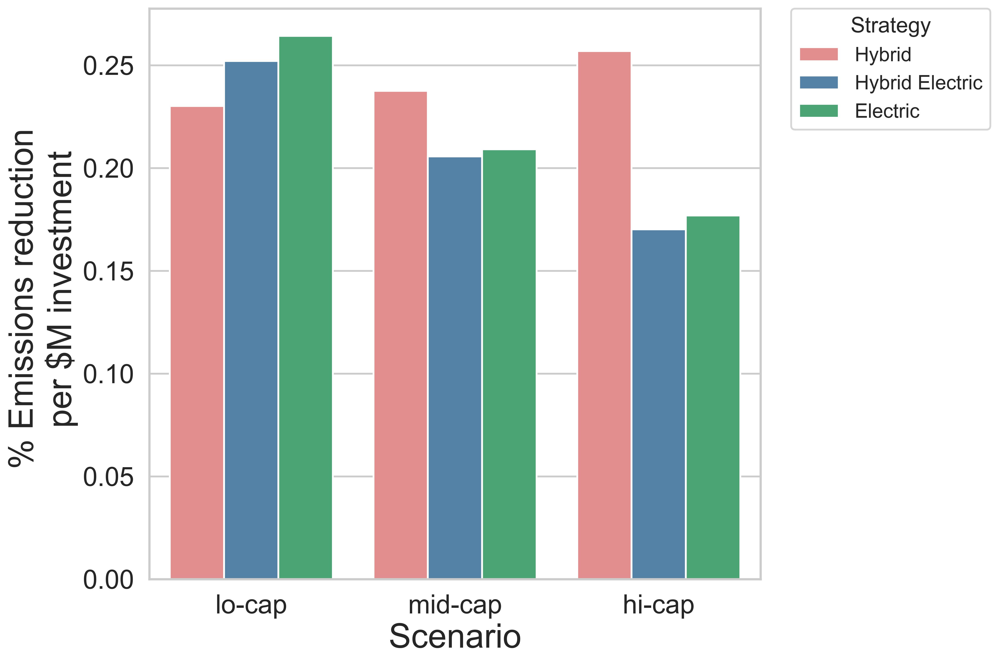

In [97]:
## Make bar plot of % emissions reduction per million

final_df['% Reduction per $M'] = final_df['%Decrease'] / final_df['Cumulative Cost']

# Defining colors for strategies
colors = {'Hybrid': 'lightcoral', 'Hybrid Electric': 'steelblue', 'Electric': 'mediumseagreen'}

# Ordering scenarios
order_of_scenarios = ['lo-cap', 'mid-cap', 'hi-cap']

# Plotting
plt.figure(figsize=(12, 8), dpi=400)
sns.barplot(data=final_df, 
            x='Scenario', 
            y='% Reduction per $M', 
            hue='Strategy',  # Color by Strategy
            hue_order=colors.keys(),
            order=order_of_scenarios,  # Explicitly specify the order
            palette=colors,  # Using the custom colors
            errorbar=None)  # Remove the error bars

plt.xlabel('Scenario', fontsize=28)
plt.ylabel('% Emissions reduction \n per $M investment', fontsize=28)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.legend(title='Strategy', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.tight_layout()
plt.savefig(r'../../figures/barplot_reduction_per_dollar.png', bbox_inches='tight', dpi=400)
plt.show()



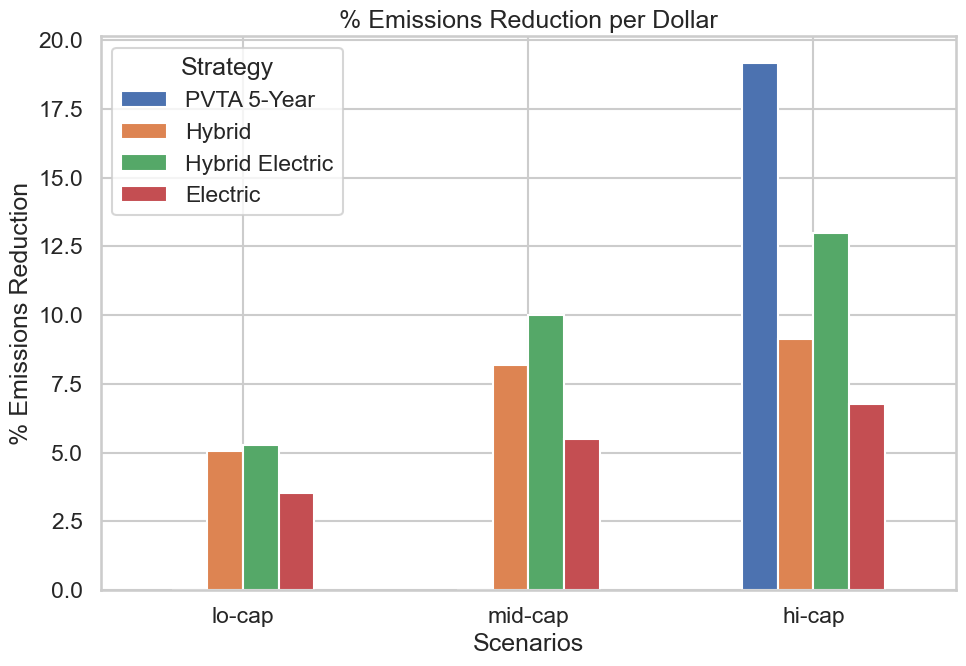

In [98]:
### Creat per dollar % reduction emissions
data = {
    'Strategy': ['PVTA 5-Year', 'Hybrid', 'Hybrid Electric', 'Electric'],
    'lo-cap': [None, 10.146346, 15.798547, 14.160109],
    'mid-cap': [None, 16.369614, 29.978030, 21.950572],
    'hi-cap': [19.181522, 18.292274, 38.984993, 27.122008]
}

pivot_df = pd.DataFrame(data).set_index('Strategy').transpose()

costs = {'PVTA 5-Year': 1, 'Hybrid': 2, 'Hybrid Electric': 3, 'Electric': 4}
for strategy, cost in costs.items():
    pivot_df[strategy] = pivot_df[strategy] / cost

pivot_df.plot(kind='bar', figsize=(10,7))
plt.title('% Emissions Reduction per Dollar')
plt.ylabel('% Emissions Reduction')
plt.xlabel('Scenarios')
plt.xticks(rotation=0)
plt.legend(title='Strategy')
plt.tight_layout()
plt.show()


In [112]:
fleet = pd.read_excel(r'../../results/fleet-composition.xlsx', engine='openpyxl')

In [113]:
fleet

,future,Year,CDB,HEB,BEB,total_fleet,electrification
0,Do-Nothing,0,189,9,15,213,0.070423
1,Do-Nothing,1,189,9,15,213,0.070423
2,Do-Nothing,2,189,9,15,213,0.070423
3,Do-Nothing,3,189,9,15,213,0.070423
4,Do-Nothing,4,189,9,15,213,0.070423
...,...,...,...,...,...,...,...
149,hi-cap Electric,9,87,9,100,196,0.510204
150,hi-cap Electric,10,78,9,116,203,0.571429
151,hi-cap Electric,11,69,9,132,210,0.628571
152,hi-cap Electric,12,61,9,148,218,0.678899


In [100]:
# Define a mapping dictionary
year_mapping = {i: 2022 + i for i in range(0, 14)}

# Apply the mapping
fleet['Year'] = fleet['Year'].map(year_mapping)

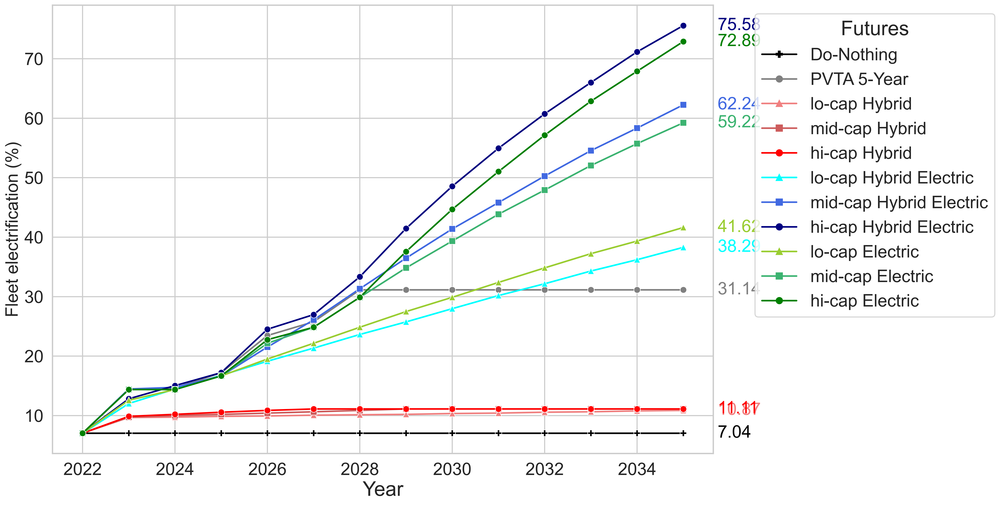

In [101]:
#fleet['Year'] = fleet['Year'] + 22
# Set the style to whitegrid
sns.set_style("whitegrid")

# Adjust the size of the plot
plt.figure(figsize=(15,10), dpi=400)

# Define a custom palette and marker order
custom_palette = {
    "Do-Nothing": "black",
    "PVTA 5-Year": "grey",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid Electric": "aqua",
    "mid-cap Hybrid Electric": "royalblue",
    "hi-cap Hybrid Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}
custom_markers = {
    "Do-Nothing": "P",
    "PVTA 5-Year": "o",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}

# Get the markers in the same order as the unique values in the 'future' column
markers_order = [custom_markers[future] for future in fleet['future'].unique()]

plot = sns.lineplot(data=fleet, x='Year', y=fleet['electrification']*100, hue='future',
                    palette=custom_palette, markers=markers_order, dashes=False, style='future')



# Annotate with the final number of the final year on each line
for line, name in zip(plot.lines, fleet['future'].unique()):
    y = line.get_ydata()[-1]
    plt.annotate(f'{y:.2f}', xy=(1, y), xytext=(6, 0), color=line.get_color(),
                 xycoords = plot.get_yaxis_transform(), textcoords="offset points",
                 size=24, va="center")

plt.ylabel('Fleet electrification (%)', fontsize=24)
plt.xlabel('Year', fontsize=28)
#plt.title('Electrification Percentage Over Years')
plt.grid(True, which="both")
plt.tight_layout()

# Move the legend outside the plot on the right side
plt.legend(title='Futures', title_fontsize='28', fontsize=24, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)    

# Save the figure with high resolution
plt.savefig(r'../../figures/Electrification_Percentage_Over_Years.png', dpi=400, bbox_inches='tight')

plt.show()


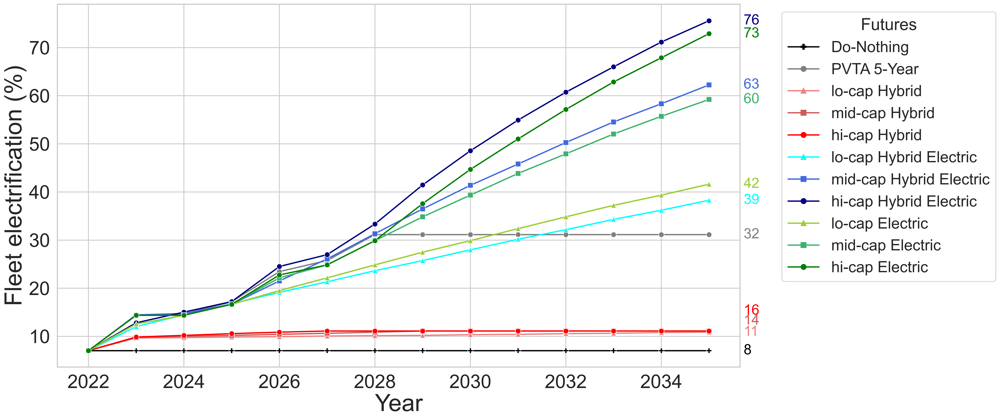

In [102]:
import math
# Set the style to whitegrid
sns.set_style("whitegrid")

# Adjust the size of the plot
plt.figure(figsize=(18,10), dpi=400)

plot = sns.lineplot(data=fleet, x='Year', y=fleet['electrification'] * 100, hue='future',
                    palette=custom_palette, markers=markers_order, dashes=False, style='future')


# Annotate with the final number of the final year on each line
y_offsets = {}  # Store the latest y positions for each unique value

for line, name in zip(plot.lines, fleet['future'].unique()):
    y = line.get_ydata()[-1]
    
    # Check if this y value is close to any previous y value
    overlap = False
    for old_y in y_offsets.values():
        if abs(old_y - y) < 2:  # This threshold (2) can be adjusted
            overlap = True
            break
    
    # Adjust y if overlapping with a previous value
    offset = 0
    while overlap:
        offset += 0.7  # Adjust by 0.5 units; this can be changed
        y_new = y + offset
        overlap = any(abs(old_y - y_new) < 2 for old_y in y_offsets.values())
        y = y_new
    
    y_offsets[name] = y
    
    plt.annotate(str(math.ceil(y)), xy=(1, y), xytext=(6, 0), color=line.get_color(),
                 xycoords=plot.get_yaxis_transform(), textcoords="offset points",
                 size=24, va="center")

plt.ylabel('Fleet electrification (%)', fontsize=40)
plt.xlabel('Year', fontsize=40)
plt.grid(True, which="both")
plt.tight_layout()

# Move the legend outside the plot on the right side
plt.legend(title='Futures', title_fontsize='28', fontsize=26, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xticks(fontsize=32)
plt.yticks(fontsize=32)
    
# Save the figure with high resolution
plt.savefig(r'../../figures/Electrification_Percentage_Over_Years.png', dpi=400, bbox_inches='tight')

plt.show()

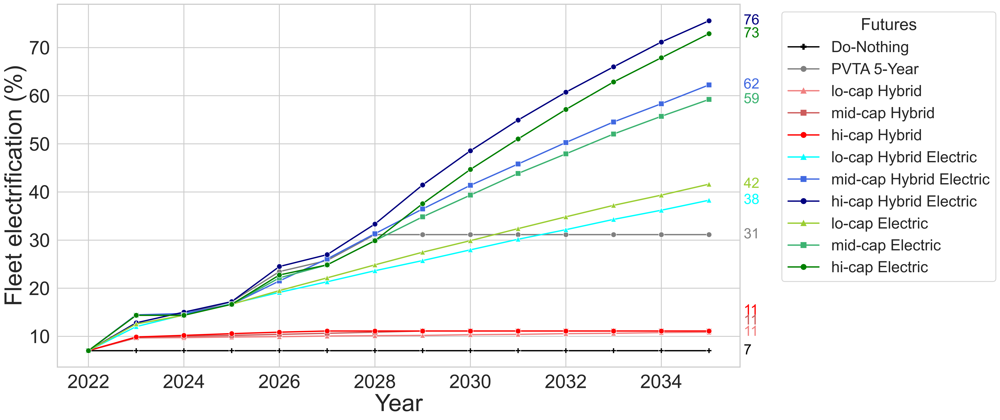

In [103]:
# Set the style to whitegrid
sns.set_style("whitegrid")

# Adjust the size of the plot
plt.figure(figsize=(18,10), dpi=400)

plot = sns.lineplot(data=fleet, x='Year', y=fleet['electrification'] * 100, hue='future',
                    palette=custom_palette, markers=markers_order, dashes=False, style='future')


# Annotate with the final number of the final year on each line
y_offsets = {}  # Store the latest y positions for each unique value
text_height = 2  # Assumed height of the text annotation (in data units, which can be adjusted)

for line, name in zip(plot.lines, fleet['future'].unique()):
    y = line.get_ydata()[-1]
    proposed_y = y
    
    while any(abs(proposed_y - old_y) < text_height for old_y in y_offsets.values()):
        proposed_y += 0.7  # Increment by 0.7 units; this can be changed
    
    y_offsets[name] = proposed_y
    
    plt.annotate(str(round(y)), xy=(1, proposed_y), xytext=(6, 0), color=line.get_color(),
                 xycoords=plot.get_yaxis_transform(), textcoords="offset points",
                 size=24, va="center")

plt.ylabel('Fleet electrification (%)', fontsize=40)
plt.xlabel('Year', fontsize=40)
plt.grid(True, which="both")
plt.tight_layout()

# Move the legend outside the plot on the right side
plt.legend(title='Futures', title_fontsize='28', fontsize=26, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xticks(fontsize=32)
plt.yticks(fontsize=32)
    
# Save the figure with high resolution
plt.savefig(r'../../figures/Electrification_Percentage_Over_Years.png', dpi=400, bbox_inches='tight')

plt.show()

In [104]:
h_pp = pd.read_csv(r'../../results/highcap-PP-optimized-variables-y.csv', low_memory=False)
h_FE = pd.read_csv(r'../../results/highcap-FE-optimized-variables-y.csv', low_memory=False)
m_FE = pd.read_csv(r'../../results/midcap-FE-optimized-variables-y.csv', low_memory=False)
l_FE = pd.read_csv(r'../../results/lowcap-FE-optimized-variables-y.csv', low_memory=False)
h_FH = pd.read_csv(r'../../results/highcap-FH-optimized-variables-y.csv', low_memory=False)
m_FH = pd.read_csv(r'../../results/midcap-FH-optimized-variables-y.csv', low_memory=False)
l_FH = pd.read_csv(r'../../results/lowcap-FH-optimized-variables-y.csv', low_memory=False)
h_HE = pd.read_csv(r'../../results/highcap-BM-optimized-variables-y.csv', low_memory=False)
m_HE = pd.read_csv(r'../../results/midcap-BM-optimized-variables-y.csv', low_memory=False)
l_HE = pd.read_csv(r'../../results/lowcap-BM-optimized-variables-y.csv', low_memory=False)

In [105]:
### Plot charging infrastructure

h_pp['future']="PVTA 5-Year"
h_FE['future']= "hi-cap Electric"
m_FE['future']= "mid-cap Electric"
l_FE['future']= "lo-cap Electric"
h_FH['future']= "hi-cap Hybrid"
m_FH['future']= "mid-cap Hybrid"
l_FH['future']= "lo-cap Hybrid"
h_HE['future']= "hi-cap Hybrid Electric"
m_HE['future']= "mid-cap Hybrid Electric"
l_HE['future']= "lo-cap Hybrid Electric"

# Concatenating all dataframes
all_dataframes = [h_pp, h_FE, m_FE, l_FE, h_FH, m_FH, l_FH, h_HE, m_HE, l_HE]
combined_df = pd.concat(all_dataframes, ignore_index=True)
# Apply the mapping
combined_df['Year'] = combined_df['Year'].map(year_mapping)

custom_palette = {
    "PVTA 5-Year": "grey",
    "lo-cap Hybrid": "lightcoral",
    "mid-cap Hybrid": "indianred",
    "hi-cap Hybrid": "red",
    "lo-cap Hybrid Electric": "aqua",
    "mid-cap Hybrid Electric": "royalblue",
    "hi-cap Hybrid Electric": "navy",
    "lo-cap Electric": "yellowgreen",
    "mid-cap Electric": "mediumseagreen",
    "hi-cap Electric": "green"
}

custom_markers = {
    "PVTA 5-Year": "o",
    "lo-cap Hybrid": "^",
    "mid-cap Hybrid": "s",
    "hi-cap Hybrid": "o",
    "lo-cap Hybrid Electric": "^",
    "mid-cap Hybrid Electric": "s",
    "hi-cap Hybrid Electric": "o",
    "lo-cap Electric": "^",
    "mid-cap Electric": "s",
    "hi-cap Electric": "o"
}

In [106]:
combined_df

,Powertrain,Value,Year,future
0,CDB,123,2022,PVTA 5-Year
1,CDB,128,2023,PVTA 5-Year
2,CDB,109,2024,PVTA 5-Year
3,CDB,95,2025,PVTA 5-Year
4,CDB,89,2026,PVTA 5-Year
...,...,...,...,...
415,BEB,51,2031,lo-cap Hybrid Electric
416,BEB,55,2032,lo-cap Hybrid Electric
417,BEB,59,2033,lo-cap Hybrid Electric
418,BEB,63,2034,lo-cap Hybrid Electric


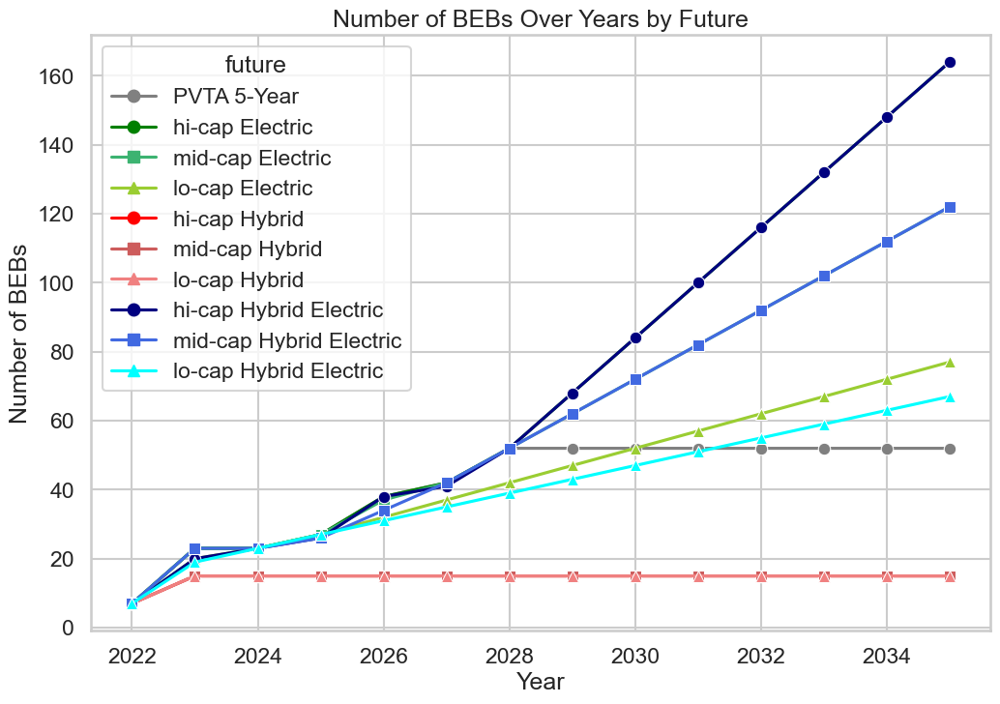

In [107]:
# Filter for rows where Powertrain is 'BEB'
beb_df = combined_df[combined_df['Powertrain'] == 'BEB']

# Plot
plt.figure(figsize=(12, 8))
plot = sns.lineplot(data=beb_df, x='Year', y='Value', hue='future', palette=custom_palette, markers=custom_markers, dashes=False, style='future')
plot.set_title('Number of BEBs Over Years by Future')
plt.ylabel('Number of BEBs')
plt.xlabel('Year')
plt.show()


In [108]:
#combined_df['Year']=combined_df['Year']+22
# Set the style to whitegrid
sns.set_style("whitegrid")

# Adjust the size of the plot
plt.figure(figsize=(60,20), dpi=400)

# Filter for rows where Powertrain is 'BEB'
beb_df = combined_df[combined_df['Powertrain'] == 'BEB']

plot = sns.barplot(data=beb_df, x='Year', y='Value', hue='future', palette=custom_palette)
plt.ylabel('Required daily charging infrastructure \n capacity (number of buses)', fontsize=70)
plt.xlabel('Year', fontsize=70)
plt.legend(title='Futures', title_fontsize='70', fontsize=50, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()

plt.xticks(fontsize=60)
plt.yticks(fontsize=60)

# Save the figure with high resolution
plt.savefig(r'../../figures/charging-infra.png', dpi=400, bbox_inches='tight')

plt.show()


In [109]:
combined_df.loc[(combined_df['Powertrain'] == 'BEB') & (combined_df['future'] == 'hi-cap Electric')]

,Powertrain,Value,Year,future
70,BEB,7,2022,hi-cap Electric
71,BEB,23,2023,hi-cap Electric
72,BEB,23,2024,hi-cap Electric
73,BEB,27,2025,hi-cap Electric
74,BEB,38,2026,hi-cap Electric
75,BEB,42,2027,hi-cap Electric
76,BEB,52,2028,hi-cap Electric
77,BEB,68,2029,hi-cap Electric
78,BEB,84,2030,hi-cap Electric
79,BEB,100,2031,hi-cap Electric


In [110]:
combined_df.loc[(combined_df['Powertrain'] == 'HEB') & (combined_df['future'] == 'hi-cap Electric')]

,Powertrain,Value,Year,future
56,HEB,7,2022,hi-cap Electric
57,HEB,9,2023,hi-cap Electric
58,HEB,9,2024,hi-cap Electric
59,HEB,9,2025,hi-cap Electric
60,HEB,9,2026,hi-cap Electric
61,HEB,9,2027,hi-cap Electric
62,HEB,9,2028,hi-cap Electric
63,HEB,9,2029,hi-cap Electric
64,HEB,9,2030,hi-cap Electric
65,HEB,9,2031,hi-cap Electric


In [152]:
fleet

,future,Year,Powertrain,New Buses
154,Do-Nothing,0,HEB,0.0
155,Do-Nothing,1,HEB,0.0
156,Do-Nothing,2,HEB,0.0
157,Do-Nothing,3,HEB,0.0
158,Do-Nothing,4,HEB,0.0
...,...,...,...,...
457,hi-cap Electric,9,BEB,16.0
458,hi-cap Electric,10,BEB,16.0
459,hi-cap Electric,11,BEB,16.0
460,hi-cap Electric,12,BEB,16.0


In [157]:
fleet_hybrid = fleet.loc [fleet['Powertrain']=="HEB"]
fleet_electric = fleet.loc [fleet['Powertrain']=="BEB"]

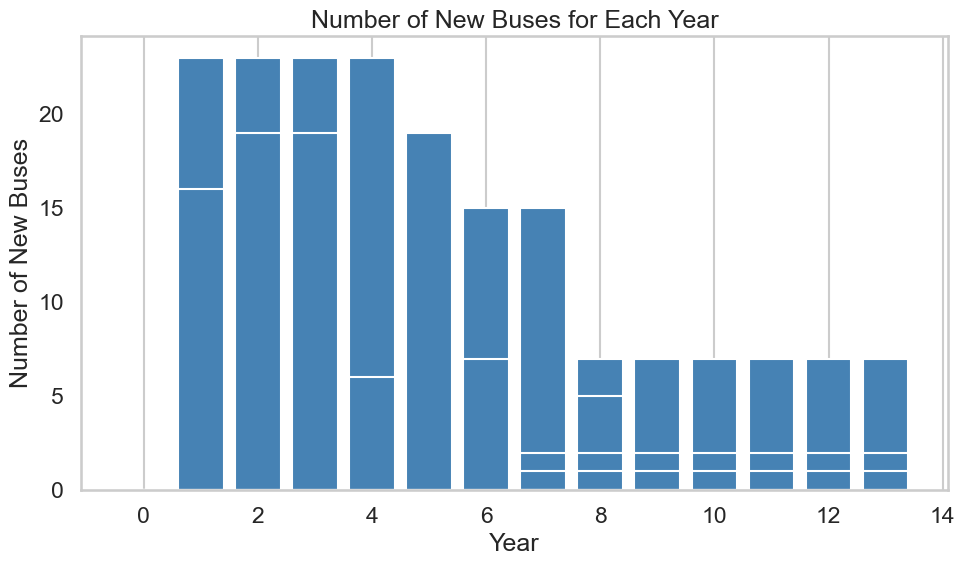

In [158]:
# Filter data based on your requirements, if any. Here I'm just considering all data.
filtered_data = fleet_hybrid

# Plot
plt.figure(figsize=(10,6))
plt.bar(filtered_data['Year'], filtered_data['New Buses'], color='steelblue')

# Add title and labels
plt.title("Number of New Buses for Each Year")
plt.xlabel("Year")
plt.ylabel("Number of New Buses")

# Display the plot
plt.tight_layout()
plt.grid(axis='y')  
plt.show()
